In [1]:
import os
import cmdstanpy
from cmdstanpy import CmdStanModel
import numpy as np
import matplotlib.pyplot as plt
import scipy.stats as stats
from scipy.stats import describe, gaussian_kde, norm, expon
import multiprocessing
import seaborn as sns
import warnings
import time

In [2]:
%matplotlib inline
plt.rcParams['figure.figsize'] = [10, 8]
plt.rcParams['font.size'] = 14

In [3]:
from thinning import sample_hawkes_process_thinning_true_vectorised
from utils import exp_kernel_vectorised, constant_background, plot_counting_process
from mle import log_likelihood
from utils import trace_plots, posterior_histograms, posterior_kdes_overlaid, stacked_credible_intervals

In [4]:
np.random.SeedSequence()

SeedSequence(
    entropy=169878887336515850714984896247841074301,
)

## Investigating the effects of missingness on Bayesian inference

Generating reproducible data

In [5]:
max_T = 400
num_samples = 10
hawkes_realisations = []

master_seed = 37789148086743724264404479032151903001
seed_seq_master = np.random.SeedSequence(master_seed)

for i in range(num_samples):

    child_seed = seed_seq_master.spawn(1)[0]

    hawkes_realisation = sample_hawkes_process_thinning_true_vectorised(max_T, constant_background, exp_kernel_vectorised, seed=child_seed)
    hawkes_realisations.append(hawkes_realisation)

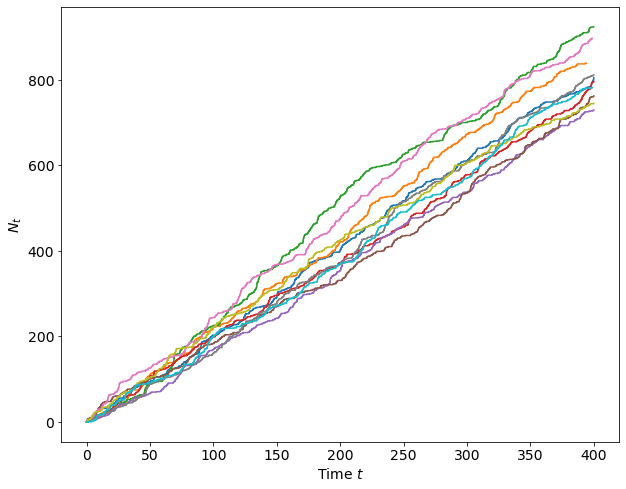

In [6]:
for h in hawkes_realisations:
    h = [0] + h
    counts = np.arange(len(h))
    plt.step(h, counts, where='post')
plt.xlabel("Time $t$")
plt.ylabel("$N_t$")
plt.show()

In [7]:
rng = np.random.default_rng(seed=master_seed)

random_label_lists = []

for realisation in hawkes_realisations:
    random_labels = rng.uniform(size=len(realisation))
    random_label_lists.append(random_labels)

In [13]:
def corrupt_realisation(realisation, random_labels, p, time_start=0, time_end=np.inf):
    return [t for t, rand_num in zip(realisation, random_labels) if rand_num < p or (t < time_start or t > time_end)]

Compiling Stan model

In [26]:
stan_file = os.path.join('.', 'models', 'exponential_priors_delta_only.stan')
model_compiled = CmdStanModel(stan_file=stan_file,
                                # If you want multi-thread option, need to recompile
                                cpp_options={'STAN_THREADS': 'TRUE'},
                                # turn off below to avoid recompiling
                                # force_compile=True
                                )

### p = 0.2

In [34]:
p = 0.2

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [36]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

00:22:06 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation0
00:22:06 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:22:20 - cmdstanpy - INFO - CmdStan done processing.
00:22:20 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation1
00:22:20 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:22:37 - cmdstanpy - INFO - CmdStan done processing.



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation2


00:22:37 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation2
00:22:37 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:22:51 - cmdstanpy - INFO - CmdStan done processing.
00:22:51 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation3
00:22:51 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:23:01 - cmdstanpy - INFO - CmdStan done processing.
00:23:01 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation4
00:23:01 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:23:10 - cmdstanpy - INFO - CmdStan done processing.
00:23:10 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation5
00:23:10 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:23:19 - cmdstanpy - INFO - CmdStan done processing.
00:23:19 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation6
00:23:19 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:23:31 - cmdstanpy - INFO - CmdStan done processing.
00:23:31 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation7
00:23:31 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:23:47 - cmdstanpy - INFO - CmdStan done processing.
00:23:47 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
00:23:47 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation8
00:23:47 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:23:56 - cmdstanpy - INFO - CmdStan done processing.
00:23:56 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation9
00:23:56 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.2\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:24:04 - cmdstanpy - INFO - CmdStan done processing.


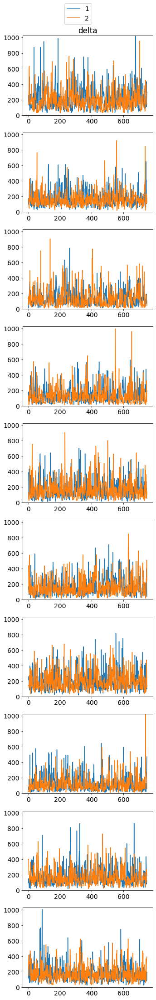

In [37]:
trace_plots(fits, ['delta'])

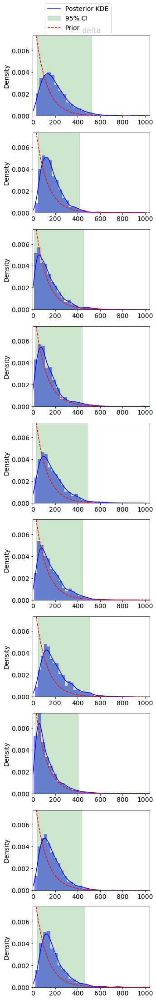

In [38]:
posterior_histograms(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

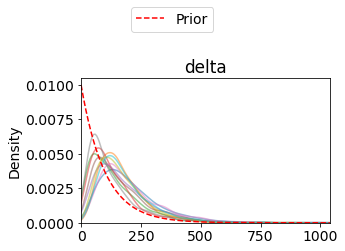

In [39]:
posterior_kdes_overlaid(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

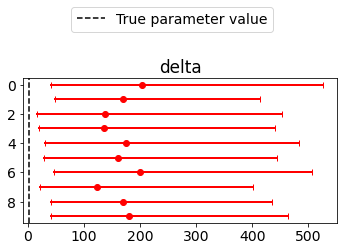

In [40]:
stacked_credible_intervals(fits, ['delta'], [2])

### p = 0.4

In [41]:
p = 0.4

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [42]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

00:27:15 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation0
00:27:15 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:28:43 - cmdstanpy - INFO - CmdStan done processing.
00:28:43 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 4 divergent transitions (0.5%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
00:28:43 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation1
00:28:43 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:29:59 - cmdstanpy - INFO - CmdStan done processing.
00:29:59 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation2
00:29:59 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:30:42 - cmdstanpy - INFO - CmdStan done processing.
00:30:42 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation3
00:30:42 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:31:51 - cmdstanpy - INFO - CmdStan done processing.
00:31:51 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
00:31:51 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation4
00:31:51 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:32:50 - cmdstanpy - INFO - CmdStan done processing.
00:32:51 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 2 divergent transitions (0.3%)
	Chain 2 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
00:32:51 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation5
00:32:51 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:33:33 - cmdstanpy - INFO - CmdStan done processing.
00:33:33 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation6
00:33:33 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:36:51 - cmdstanpy - INFO - CmdStan done processing.
00:36:51 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 10 divergent transitions (1.3%)
	Chain 2 had 13 divergent transitions (1.7%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
00:36:51 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation7
00:36:51 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:39:10 - cmdstanpy - INFO - CmdStan done processing.
00:39:10 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
00:39:10 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation8
00:39:10 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:39:58 - cmdstanpy - INFO - CmdStan done processing.
00:39:58 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation9
00:39:58 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.4\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:40:52 - cmdstanpy - INFO - CmdStan done processing.


In [50]:
p=0.4
fits = []
save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')
for j in range(10):
    save_path = os.path.join(save_dir, f'realisation{j}')
    fits.append(cmdstanpy.from_csv(save_path))

08:26:18 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 4 divergent transitions (0.5%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
08:26:18 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
08:26:18 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 2 divergent transitions (0.3%)
	Chain 2 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
08:26:18 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 10 divergent transitions (1.3%)
	Chain 2 had 13 divergent transitions (1.7%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
08:26:18 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transit

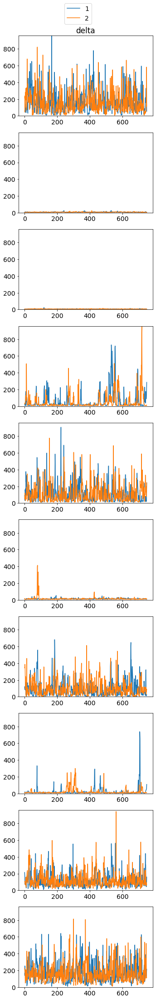

In [51]:
trace_plots(fits, ['delta'])

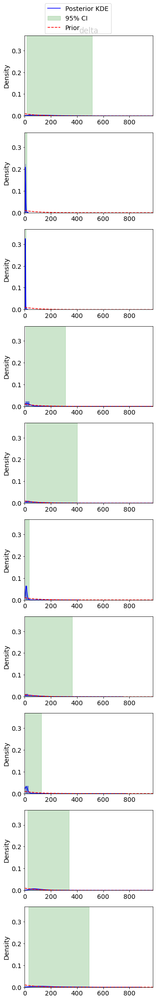

In [52]:
posterior_histograms(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

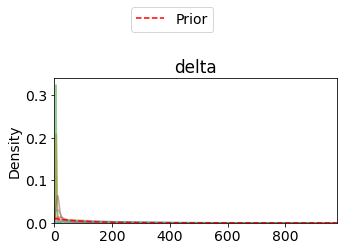

In [53]:
posterior_kdes_overlaid(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

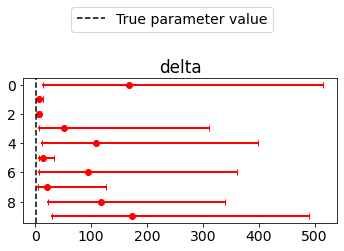

In [54]:
stacked_credible_intervals(fits, ['delta'], [2])

### p = 0.6

In [43]:
p = 0.6

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [44]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

00:40:53 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation0
00:40:53 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:42:20 - cmdstanpy - INFO - CmdStan done processing.
00:42:20 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation1
00:42:20 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:43:55 - cmdstanpy - INFO - CmdStan done processing.
00:43:55 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation2
00:43:55 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:45:25 - cmdstanpy - INFO - CmdStan done processing.
00:45:25 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation3
00:45:25 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:46:57 - cmdstanpy - INFO - CmdStan done processing.
00:46:57 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation4
00:46:57 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:48:21 - cmdstanpy - INFO - CmdStan done processing.
00:48:21 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation5
00:48:21 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:49:27 - cmdstanpy - INFO - CmdStan done processing.
00:49:27 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation6
00:49:27 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:50:55 - cmdstanpy - INFO - CmdStan done processing.
00:50:55 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation7
00:50:55 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:52:11 - cmdstanpy - INFO - CmdStan done processing.
00:52:11 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation8
00:52:11 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:53:21 - cmdstanpy - INFO - CmdStan done processing.
00:53:21 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation9
00:53:21 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.6\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:54:47 - cmdstanpy - INFO - CmdStan done processing.


In [55]:
p=0.6
fits = []
save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')
for j in range(10):
    save_path = os.path.join(save_dir, f'realisation{j}')
    fits.append(cmdstanpy.from_csv(save_path))

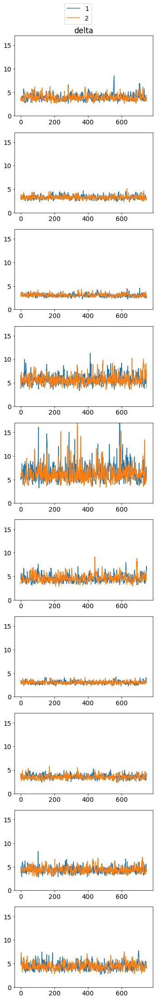

In [56]:
trace_plots(fits, ['delta'])

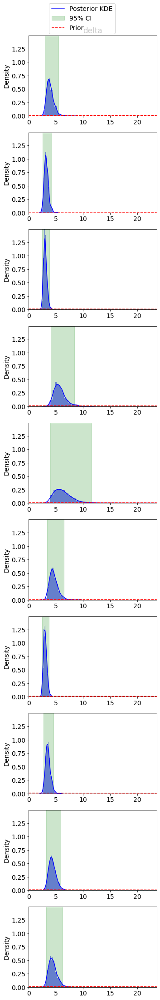

In [57]:
posterior_histograms(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

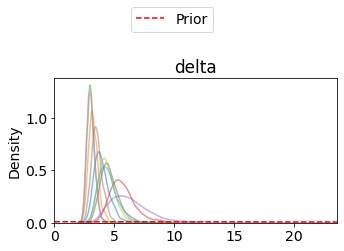

In [58]:
posterior_kdes_overlaid(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

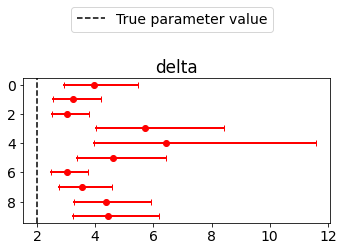

In [59]:
stacked_credible_intervals(fits, ['delta'], [2])

### p = 0.8

In [45]:
p = 0.8

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [46]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

00:54:48 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation0
00:54:48 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:57:11 - cmdstanpy - INFO - CmdStan done processing.
00:57:11 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation1
00:57:11 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:59:26 - cmdstanpy - INFO - CmdStan done processing.
00:59:26 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation2
00:59:26 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:02:11 - cmdstanpy - INFO - CmdStan done processing.


01:02:13 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation3
01:02:13 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:04:28 - cmdstanpy - INFO - CmdStan done processing.
01:04:29 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation4
01:04:29 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:06:25 - cmdstanpy - INFO - CmdStan done processing.
01:06:25 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation5
01:06:25 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:08:44 - cmdstanpy - INFO - CmdStan done processing.


01:08:44 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation6
01:08:44 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:11:28 - cmdstanpy - INFO - CmdStan done processing.
01:11:28 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation7
01:11:28 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:14:19 - cmdstanpy - INFO - CmdStan done processing.
01:14:19 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation8
01:14:19 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:16:07 - cmdstanpy - INFO - CmdStan done processing.
01:16:07 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation9
01:16:07 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=0.8\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:18:19 - cmdstanpy - INFO - CmdStan done processing.


In [60]:
p=0.8
fits = []
save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')
for j in range(10):
    save_path = os.path.join(save_dir, f'realisation{j}')
    fits.append(cmdstanpy.from_csv(save_path))

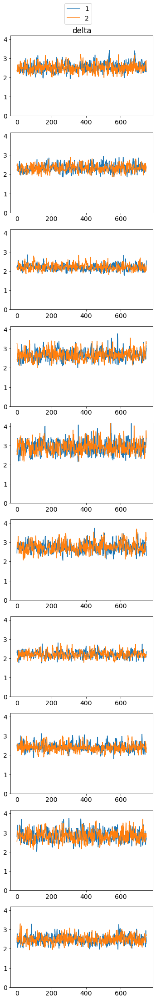

In [61]:
trace_plots(fits, ['delta'])

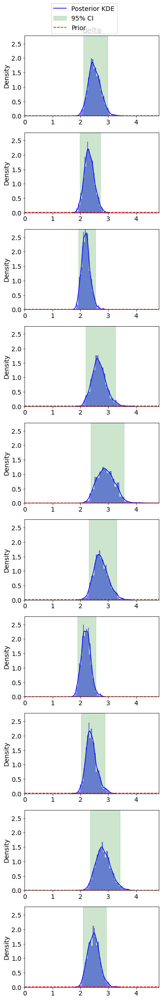

In [62]:
posterior_histograms(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

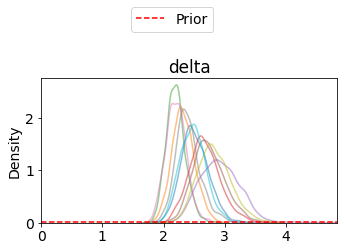

In [63]:
posterior_kdes_overlaid(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

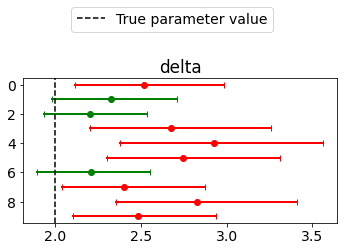

In [64]:
stacked_credible_intervals(fits, ['delta'], [2])

### p = 1

In [47]:
p = 1

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [48]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

01:18:20 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation0
01:18:20 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:21:20 - cmdstanpy - INFO - CmdStan done processing.
01:21:20 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation1
01:21:20 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:24:47 - cmdstanpy - INFO - CmdStan done processing.
01:24:47 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation2
01:24:47 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:28:54 - cmdstanpy - INFO - CmdStan done processing.
01:28:54 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation3
01:28:54 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:32:06 - cmdstanpy - INFO - CmdStan done processing.
01:32:07 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation4
01:32:07 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:34:50 - cmdstanpy - INFO - CmdStan done processing.
01:34:51 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation5
01:34:51 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:38:07 - cmdstanpy - INFO - CmdStan done processing.
01:38:08 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation6
01:38:08 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:41:58 - cmdstanpy - INFO - CmdStan done processing.
01:41:58 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation7
01:41:58 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:45:20 - cmdstanpy - INFO - CmdStan done processing.
01:45:20 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation8
01:45:20 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:48:05 - cmdstanpy - INFO - CmdStan done processing.
01:48:05 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation9
01:48:05 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_exponential_priors_delta_only\p=1\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:51:10 - cmdstanpy - INFO - CmdStan done processing.


In [65]:
p=1
fits = []
save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')
for j in range(10):
    save_path = os.path.join(save_dir, f'realisation{j}')
    fits.append(cmdstanpy.from_csv(save_path))

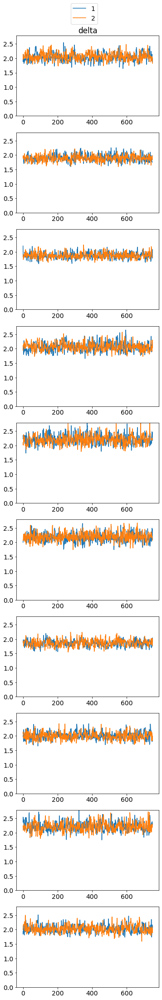

In [66]:
trace_plots(fits, ['delta'])

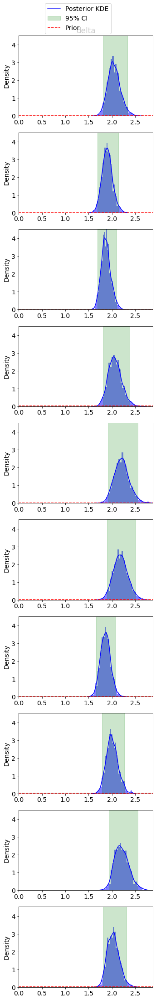

In [67]:
posterior_histograms(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

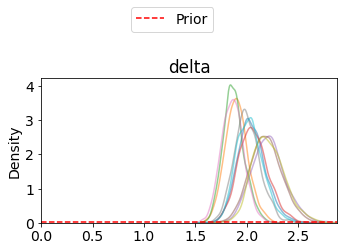

In [68]:
posterior_kdes_overlaid(fits, ['delta'], [lambda x: expon.pdf(x, scale=1/0.01)])

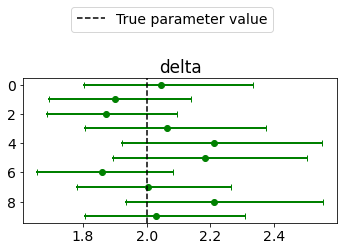

In [69]:
stacked_credible_intervals(fits, ['delta'], [2])

Now plotted together

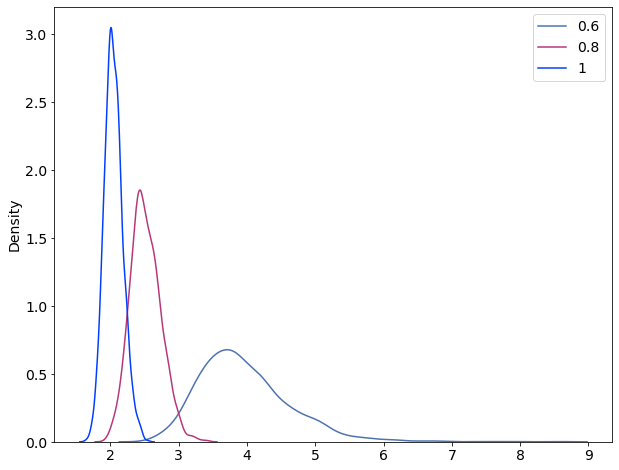

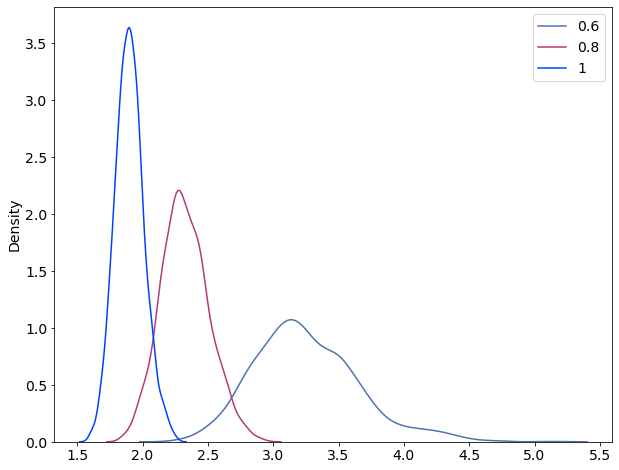

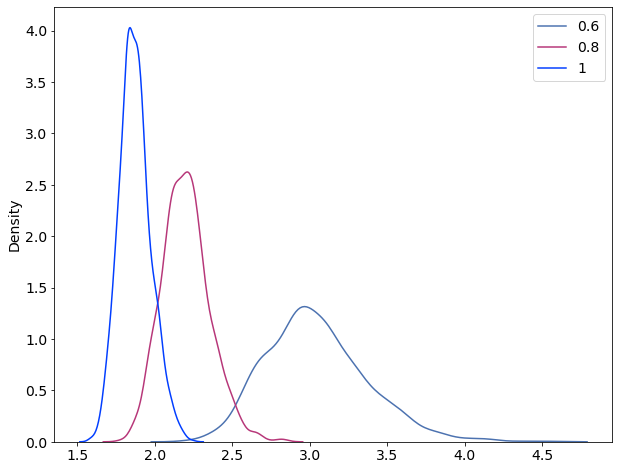

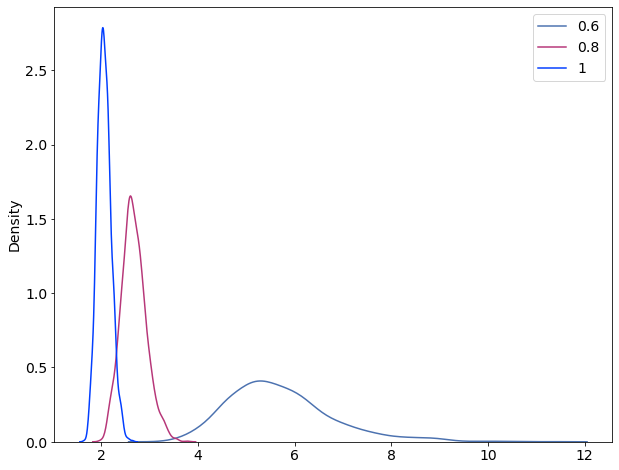

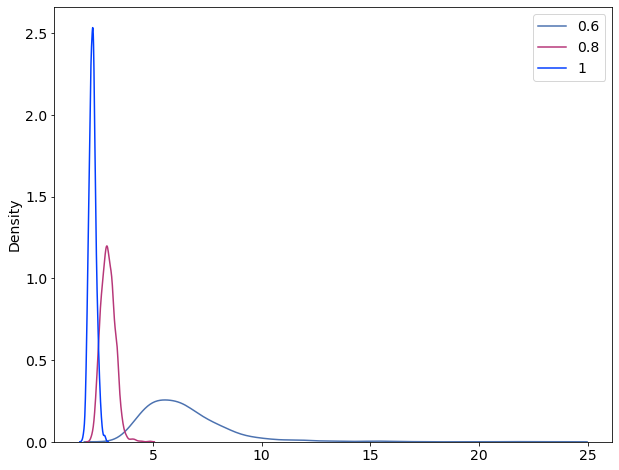

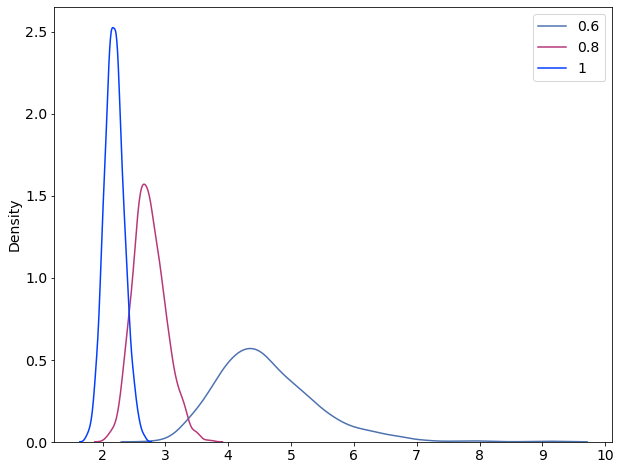

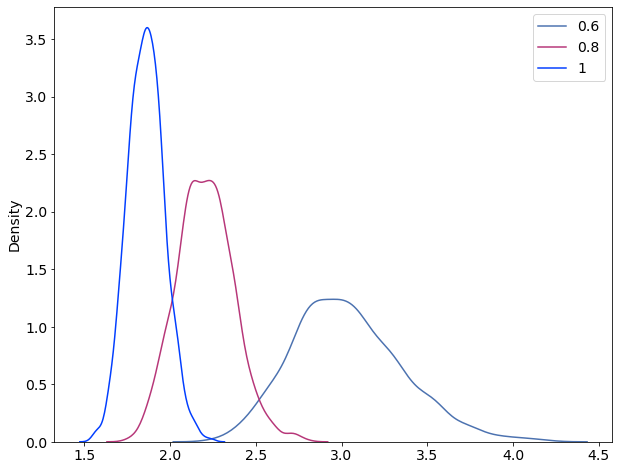

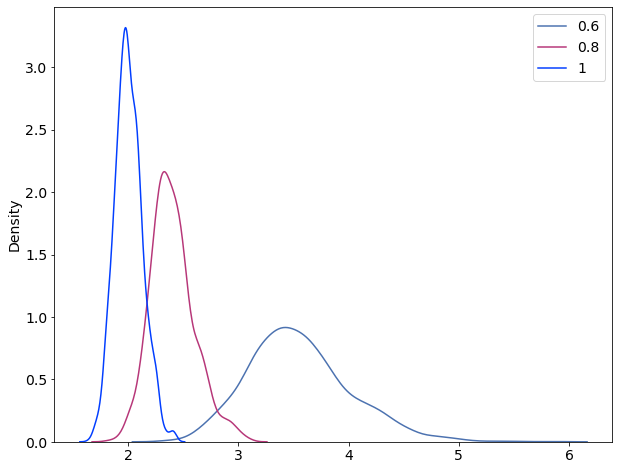

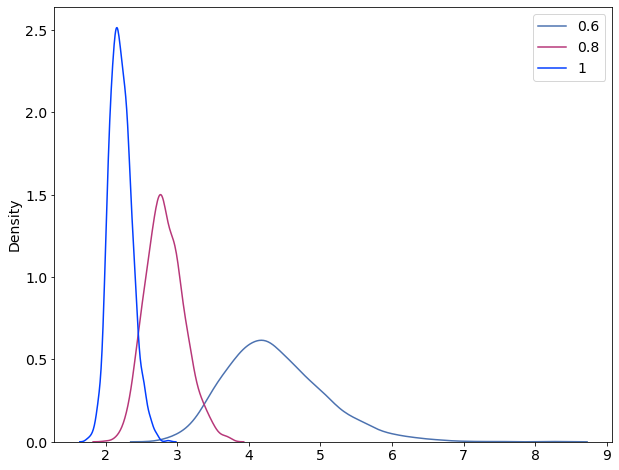

In [76]:
for j in range(9):
    colors = ['deep','magma','bright', 'crest']
    for i, p in enumerate([0.6, 0.8, 1]):
        save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors_delta_only', f'p={p}')
        save_path = os.path.join(save_dir, f'realisation{j}')
        fit = cmdstanpy.from_csv(save_path)
        df = fit.draws_pd('delta')
        with warnings.catch_warnings():
            warnings.simplefilter(action='ignore', category=FutureWarning)
            sns.kdeplot(df, palette=colors[i], label=p)
    plt.legend()
    plt.show()

## Now without alpha and mu fixed

In [89]:
param_strings = ['mu', 'alpha', 'delta']                 

In [77]:
stan_file = os.path.join('.', 'models', 'exponential_priors.stan')
model_compiled = CmdStanModel(stan_file=stan_file,
                                # If you want multi-thread option, need to recompile
                                cpp_options={'STAN_THREADS': 'TRUE'},
                                # turn off below to avoid recompiling
                                # force_compile=True
                                )

### p = 0.2

In [78]:
p = 0.2

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [79]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_exponential_priors\p=0.2\realisation0


08:34:45 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.2\realisation0
08:34:45 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:35:09 - cmdstanpy - INFO - CmdStan done processing.
08:35:09 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.2\realisation1
08:35:09 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_exponential_priors\p=0.2\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:35:52 - cmdstanpy - INFO - CmdStan done processing.
08:35:52 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
08:35:52 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.2\realisation2
08:35:52 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_exponential_priors\p=0.2\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:36:23 - cmdstanpy - INFO - CmdStan done processing.
08:36:24 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.2\realisation3
08:36:24 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_exponential_priors\p=0.2\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:36:54 - cmdstanpy - INFO - CmdStan done processing.
08:36:54 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.2\realisation4



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_exponential_priors\p=0.2\realisation4


08:36:54 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:37:19 - cmdstanpy - INFO - CmdStan done processing.
08:37:19 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.2\realisation5
08:37:19 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_exponential_priors\p=0.2\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:37:47 - cmdstanpy - INFO - CmdStan done processing.
08:37:47 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.2\realisation6
08:37:47 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_exponential_priors\p=0.2\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:38:36 - cmdstanpy - INFO - CmdStan done processing.
08:38:36 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 4 divergent transitions (0.5%)
	Chain 2 had 8 divergent transitions (1.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
08:38:36 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.2\realisation7
08:38:36 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_exponential_priors\p=0.2\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:39:13 - cmdstanpy - INFO - CmdStan done processing.
08:39:13 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.2\realisation8
08:39:13 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_exponential_priors\p=0.2\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:39:41 - cmdstanpy - INFO - CmdStan done processing.
08:39:41 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.2\realisation9
08:39:41 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_exponential_priors\p=0.2\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:40:08 - cmdstanpy - INFO - CmdStan done processing.
08:40:08 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Chain 2 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


In [86]:
p=0.2
fits = []
save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')
for j in range(10):
    save_path = os.path.join(save_dir, f'realisation{j}')
    fits.append(cmdstanpy.from_csv(save_path))

11:23:09 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 2 had 1 divergent transitions (0.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
11:23:09 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 4 divergent transitions (0.5%)
	Chain 2 had 8 divergent transitions (1.1%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.
11:23:10 - cmdstanpy - WARNING - Some chains may have failed to converge.
	Chain 1 had 1 divergent transitions (0.1%)
	Chain 2 had 2 divergent transitions (0.3%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


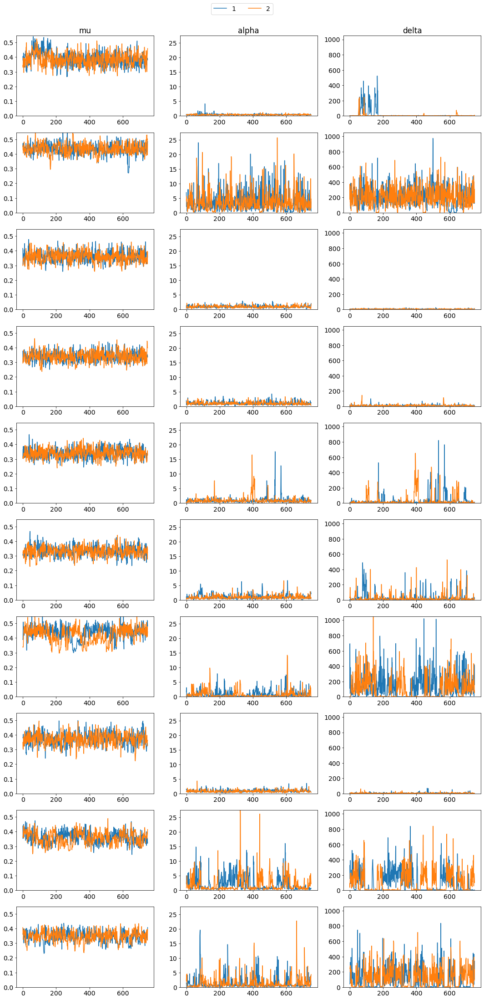

In [90]:
trace_plots(fits, param_strings)

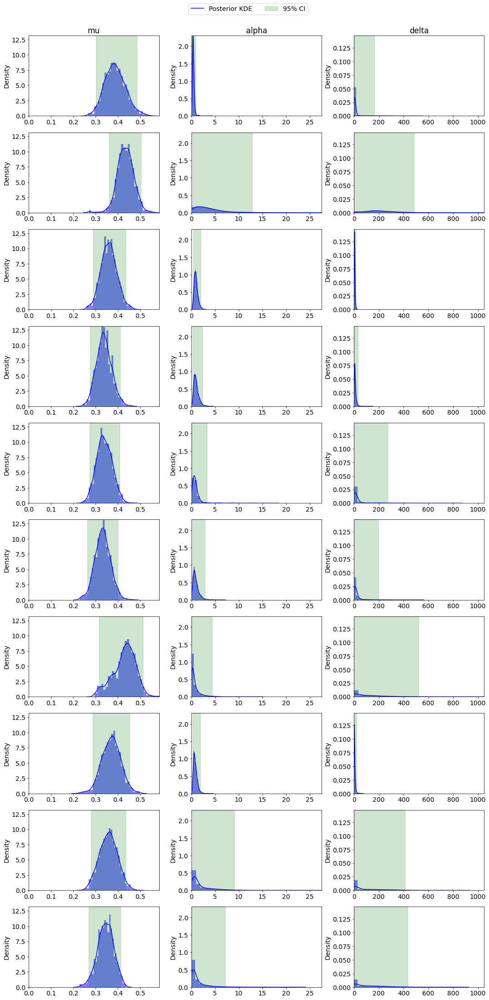

In [91]:
posterior_histograms(fits, param_strings)

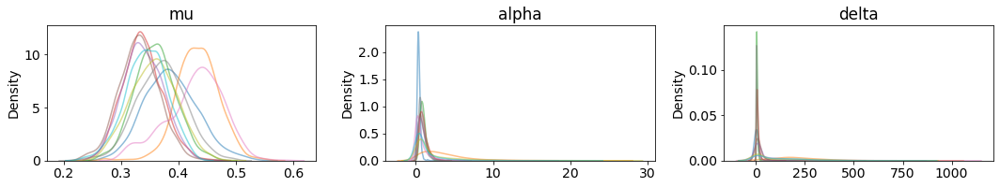

In [92]:
posterior_kdes_overlaid(fits, param_strings)

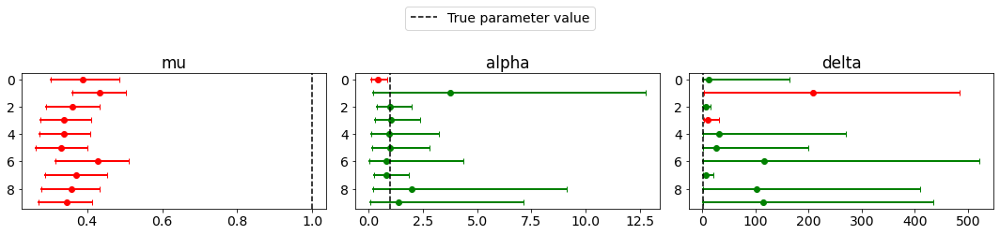

In [93]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

### p = 0.4

In [80]:
p = 0.4

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [81]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

08:40:08 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.4\realisation0
08:40:08 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_exponential_priors\p=0.4\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:41:43 - cmdstanpy - INFO - CmdStan done processing.
08:41:43 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.4\realisation1
08:41:43 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_exponential_priors\p=0.4\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:43:26 - cmdstanpy - INFO - CmdStan done processing.
08:43:26 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.4\realisation2
08:43:26 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_exponential_priors\p=0.4\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:45:13 - cmdstanpy - INFO - CmdStan done processing.
08:45:13 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.4\realisation3
08:45:13 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_exponential_priors\p=0.4\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:46:57 - cmdstanpy - INFO - CmdStan done processing.
08:46:57 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.4\realisation4
08:46:57 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_exponential_priors\p=0.4\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:48:49 - cmdstanpy - INFO - CmdStan done processing.
08:48:49 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.4\realisation5
08:48:49 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_exponential_priors\p=0.4\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:50:13 - cmdstanpy - INFO - CmdStan done processing.
08:50:13 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.4\realisation6
08:50:13 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_exponential_priors\p=0.4\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:52:27 - cmdstanpy - INFO - CmdStan done processing.
08:52:27 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.4\realisation7
08:52:27 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_exponential_priors\p=0.4\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:54:08 - cmdstanpy - INFO - CmdStan done processing.
08:54:08 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.4\realisation8
08:54:08 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_exponential_priors\p=0.4\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:55:34 - cmdstanpy - INFO - CmdStan done processing.
08:55:34 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.4\realisation9
08:55:34 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_exponential_priors\p=0.4\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

08:57:04 - cmdstanpy - INFO - CmdStan done processing.


In [94]:
p=0.4
fits = []
save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')
for j in range(10):
    save_path = os.path.join(save_dir, f'realisation{j}')
    fits.append(cmdstanpy.from_csv(save_path))

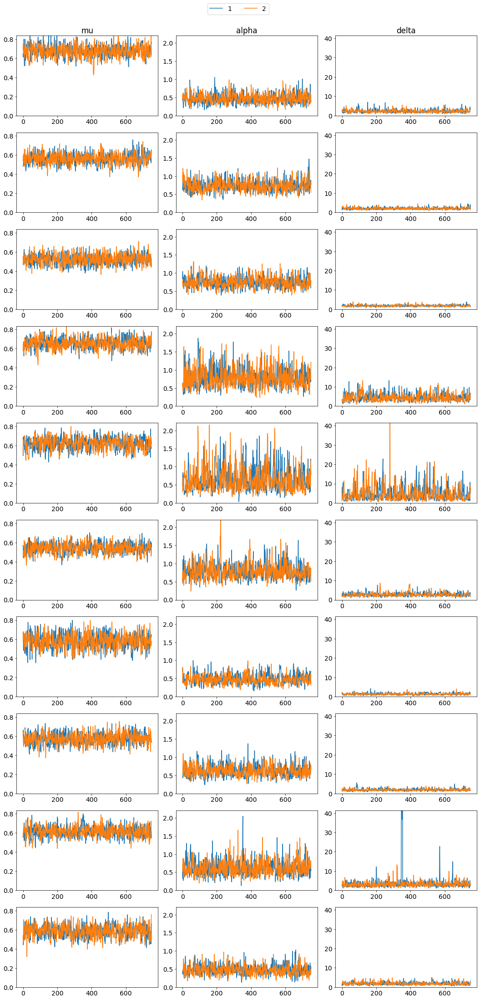

In [95]:
trace_plots(fits, param_strings)

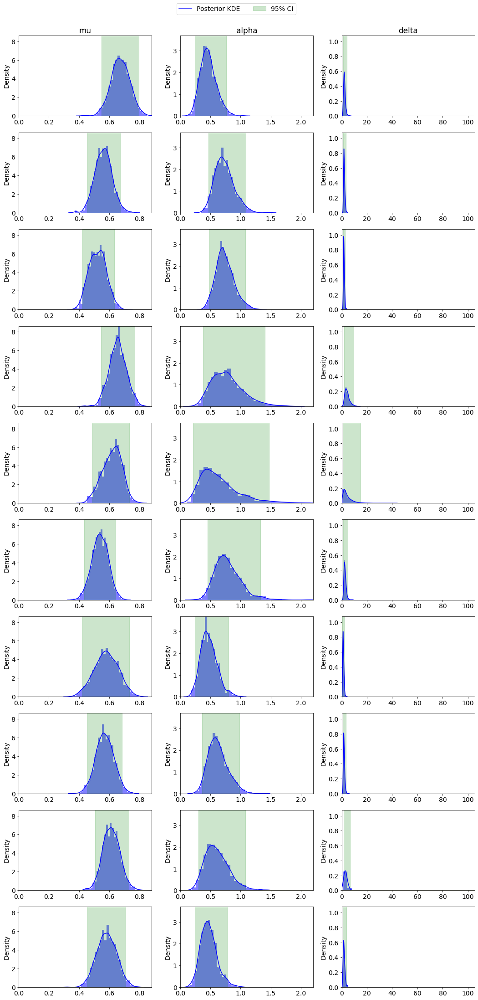

In [96]:
posterior_histograms(fits, param_strings)

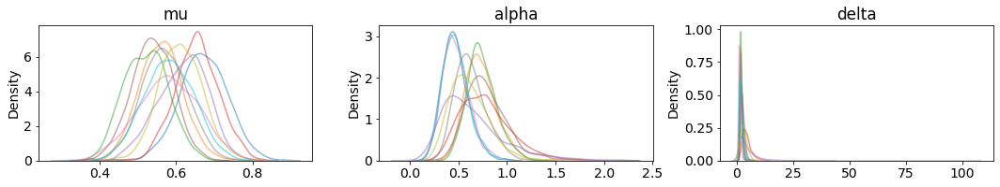

In [97]:
posterior_kdes_overlaid(fits, param_strings)

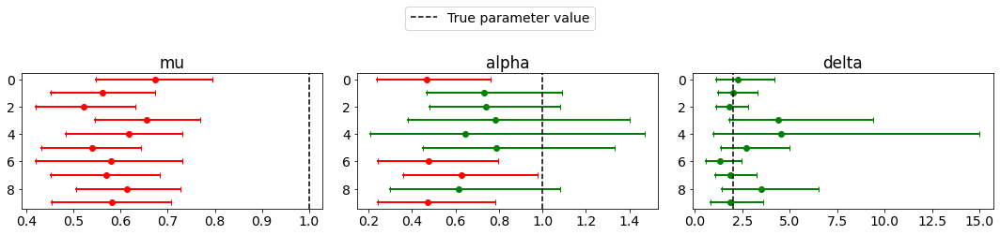

In [98]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

### p = 0.6

In [82]:
p = 0.6

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [83]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

08:57:04 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.6\realisation0
08:57:04 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_exponential_priors\p=0.6\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

09:00:39 - cmdstanpy - INFO - CmdStan done processing.
09:00:39 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.6\realisation1
09:00:39 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_exponential_priors\p=0.6\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

09:04:47 - cmdstanpy - INFO - CmdStan done processing.
09:04:47 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.6\realisation2
09:04:47 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_exponential_priors\p=0.6\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

09:09:49 - cmdstanpy - INFO - CmdStan done processing.
09:09:49 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.6\realisation3
09:09:49 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_exponential_priors\p=0.6\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

09:14:03 - cmdstanpy - INFO - CmdStan done processing.
09:14:03 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.6\realisation4
09:14:03 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_exponential_priors\p=0.6\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

09:17:13 - cmdstanpy - INFO - CmdStan done processing.
09:17:13 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.6\realisation5
09:17:13 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_exponential_priors\p=0.6\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

09:20:46 - cmdstanpy - INFO - CmdStan done processing.
09:20:46 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.6\realisation6



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_exponential_priors\p=0.6\realisation6


09:20:46 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

09:25:35 - cmdstanpy - INFO - CmdStan done processing.
09:25:35 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.6\realisation7
09:25:35 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_exponential_priors\p=0.6\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

09:29:51 - cmdstanpy - INFO - CmdStan done processing.
09:29:51 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.6\realisation8
09:29:51 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_exponential_priors\p=0.6\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

09:33:05 - cmdstanpy - INFO - CmdStan done processing.
09:33:05 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.6\realisation9



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_exponential_priors\p=0.6\realisation9


09:33:05 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

09:36:41 - cmdstanpy - INFO - CmdStan done processing.


In [99]:
p=0.6
fits = []
save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')
for j in range(10):
    save_path = os.path.join(save_dir, f'realisation{j}')
    fits.append(cmdstanpy.from_csv(save_path))

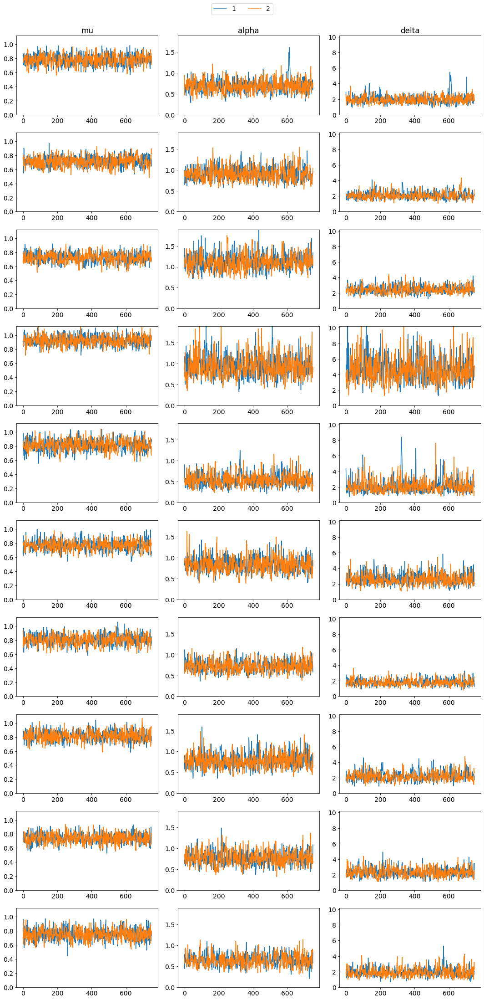

In [100]:
trace_plots(fits, param_strings)

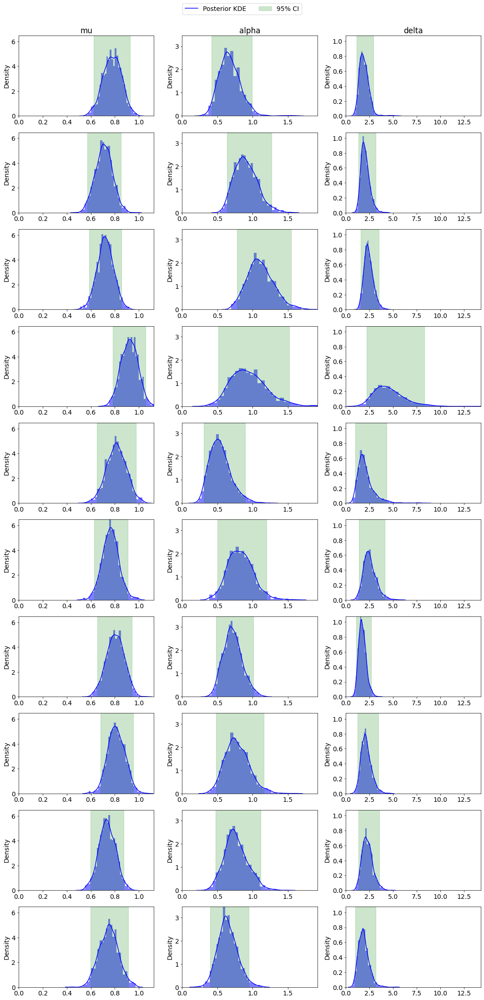

In [101]:
posterior_histograms(fits, param_strings)

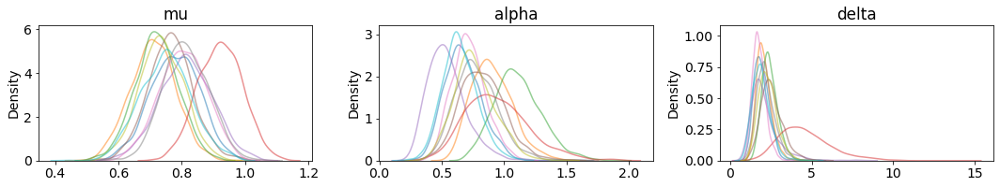

In [102]:
posterior_kdes_overlaid(fits, param_strings)

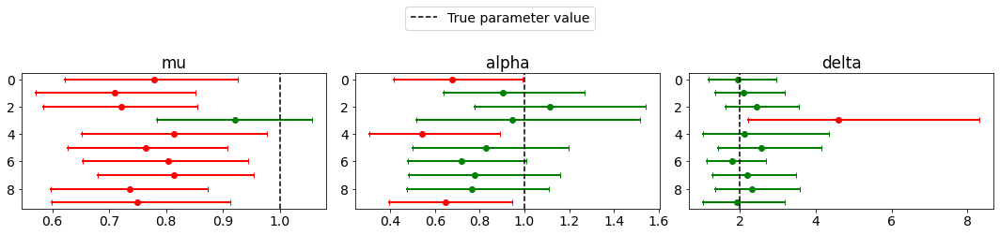

In [103]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

### p = 0.8

In [104]:
p = 0.8

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [105]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

11:28:52 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_exponential_priors\p=0.8\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

11:36:47 - cmdstanpy - INFO - CmdStan done processing.
11:36:47 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_exponential_priors\p=0.8\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

11:43:06 - cmdstanpy - INFO - CmdStan done processing.
11:43:06 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_exponential_priors\p=0.8\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

11:56:58 - cmdstanpy - INFO - CmdStan done processing.
11:56:59 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.8\realisation3
11:56:59 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_exponential_priors\p=0.8\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

12:04:45 - cmdstanpy - INFO - CmdStan done processing.
12:04:45 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.8\realisation4
12:04:45 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_exponential_priors\p=0.8\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

12:10:07 - cmdstanpy - INFO - CmdStan done processing.
12:10:07 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.8\realisation5
12:10:07 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_exponential_priors\p=0.8\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

12:16:54 - cmdstanpy - INFO - CmdStan done processing.
12:16:55 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.8\realisation6



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_exponential_priors\p=0.8\realisation6


12:16:55 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

12:25:52 - cmdstanpy - INFO - CmdStan done processing.
12:25:52 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.8\realisation7
12:25:52 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_exponential_priors\p=0.8\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

12:33:58 - cmdstanpy - INFO - CmdStan done processing.
12:33:58 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.8\realisation8
12:33:58 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_exponential_priors\p=0.8\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

12:39:34 - cmdstanpy - INFO - CmdStan done processing.
12:39:34 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=0.8\realisation9
12:39:34 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_exponential_priors\p=0.8\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

12:46:46 - cmdstanpy - INFO - CmdStan done processing.


In [106]:
p=0.8
fits = []
save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')
for j in range(10):
    save_path = os.path.join(save_dir, f'realisation{j}')
    fits.append(cmdstanpy.from_csv(save_path))

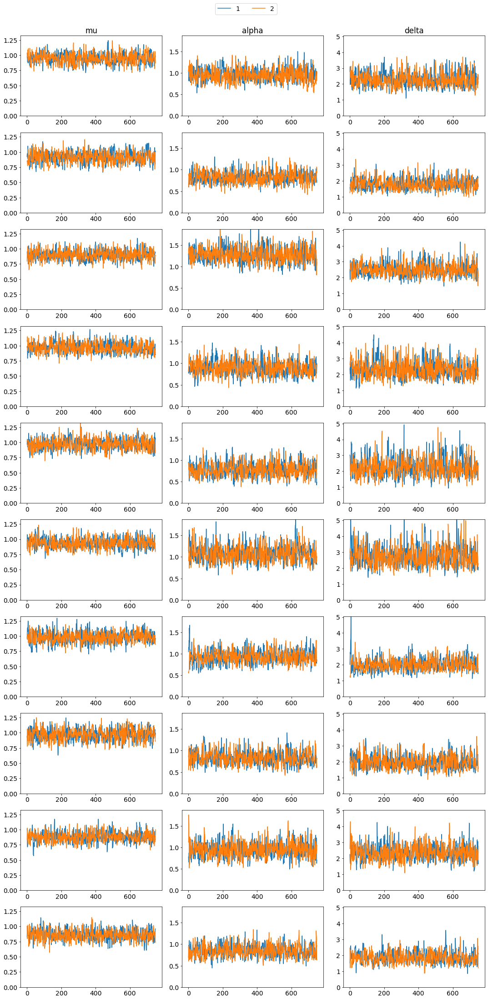

In [107]:
trace_plots(fits, param_strings)

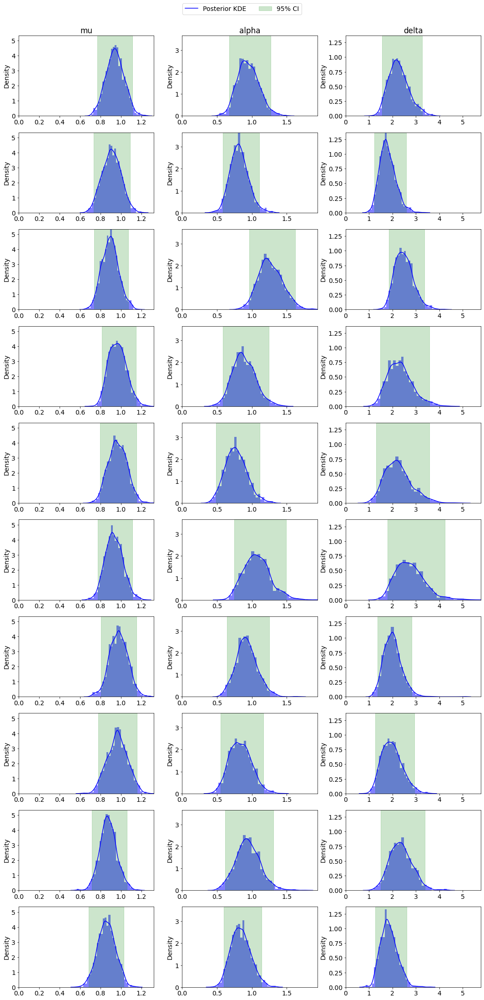

In [108]:
posterior_histograms(fits, param_strings)

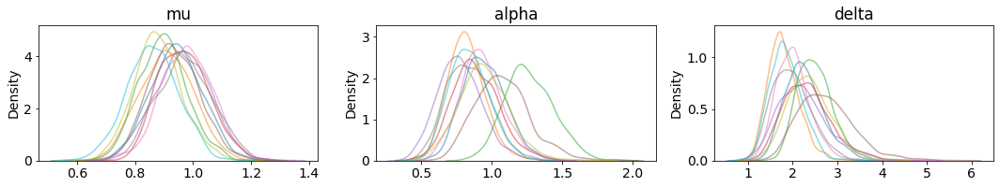

In [109]:
posterior_kdes_overlaid(fits, param_strings)

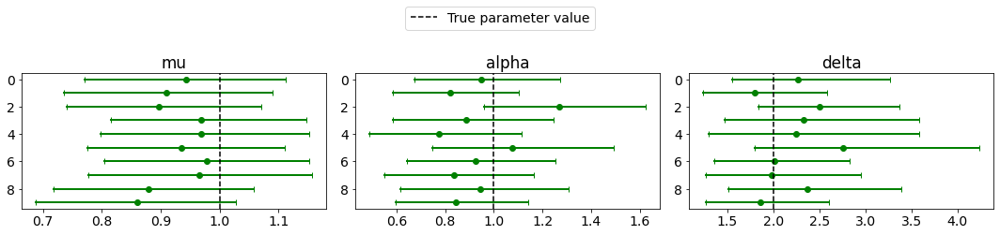

In [110]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

### p = 1

In [111]:
p = 1

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [112]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_exponential_priors\p=1\realisation0


13:12:44 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=1\realisation0
13:12:44 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

13:21:31 - cmdstanpy - INFO - CmdStan done processing.
13:21:31 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=1\realisation1
13:21:31 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_exponential_priors\p=1\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

13:31:34 - cmdstanpy - INFO - CmdStan done processing.
13:31:34 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=1\realisation2
13:31:34 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_exponential_priors\p=1\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

13:45:32 - cmdstanpy - INFO - CmdStan done processing.
13:45:32 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=1\realisation3
13:45:32 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_exponential_priors\p=1\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

13:57:19 - cmdstanpy - INFO - CmdStan done processing.
13:57:19 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=1\realisation4
13:57:19 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_exponential_priors\p=1\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

14:06:32 - cmdstanpy - INFO - CmdStan done processing.
14:06:32 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=1\realisation5
14:06:32 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_exponential_priors\p=1\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

14:15:53 - cmdstanpy - INFO - CmdStan done processing.
14:15:53 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=1\realisation6
14:15:53 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_exponential_priors\p=1\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

14:27:42 - cmdstanpy - INFO - CmdStan done processing.
14:27:42 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=1\realisation7
14:27:42 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_exponential_priors\p=1\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

14:37:53 - cmdstanpy - INFO - CmdStan done processing.
14:37:53 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=1\realisation8
14:37:53 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_exponential_priors\p=1\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

14:45:07 - cmdstanpy - INFO - CmdStan done processing.
14:45:08 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_exponential_priors\p=1\realisation9
14:45:08 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_exponential_priors\p=1\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

14:54:02 - cmdstanpy - INFO - CmdStan done processing.


In [113]:
p=1
fits = []
save_dir = os.path.join('.', 'saved_fits', 'missingness_exponential_priors', f'p={p}')
for j in range(10):
    save_path = os.path.join(save_dir, f'realisation{j}')
    fits.append(cmdstanpy.from_csv(save_path))

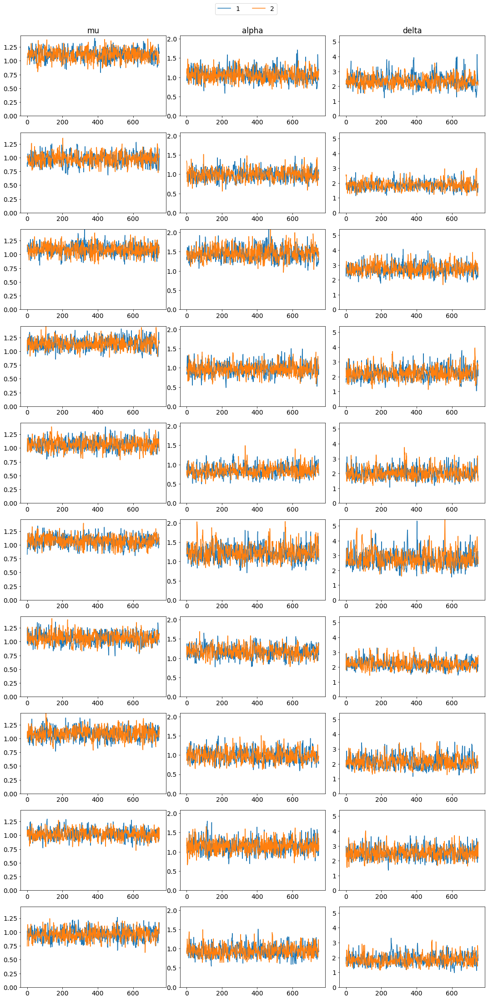

In [114]:
trace_plots(fits, param_strings)

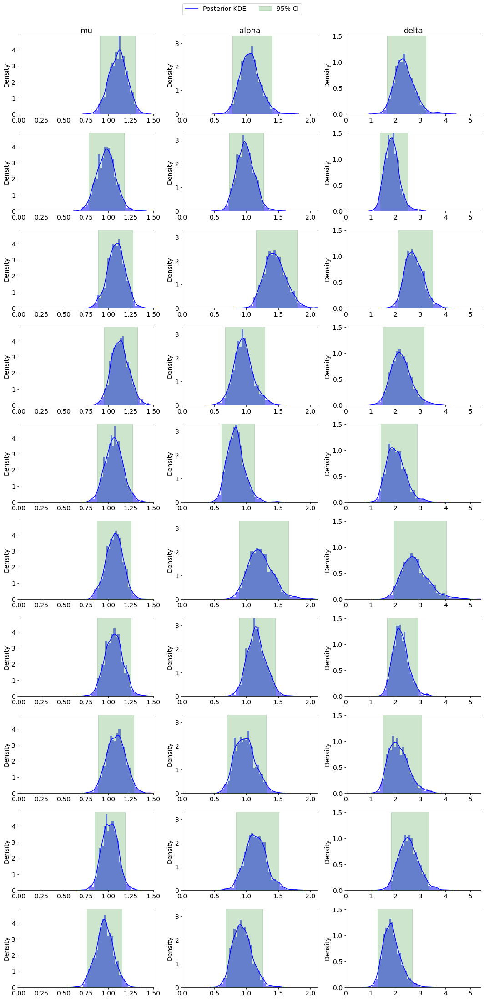

In [115]:
posterior_histograms(fits, param_strings)

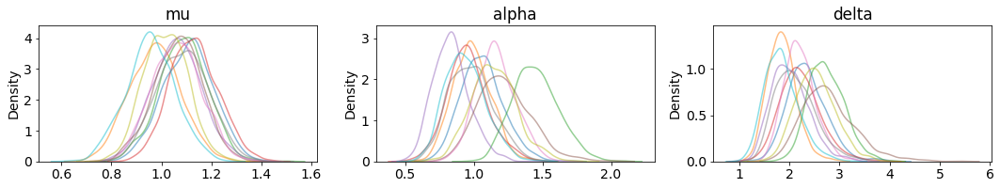

In [116]:
posterior_kdes_overlaid(fits, param_strings)

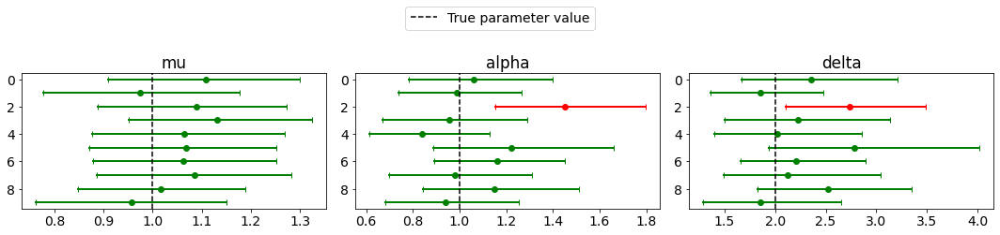

In [117]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

Can do plot of each realisation as p changes

## Missingness at start and end

### At start

In [131]:
p=0.5

Do for different values of T_end

#### T_end=100

In [132]:
T_end=100

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p, time_end=T_end)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [140]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_start_exponential_priors', f'T_end={T_end}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

15:06:56 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=100\realisation0
15:06:56 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=100\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

15:14:20 - cmdstanpy - INFO - CmdStan done processing.
15:14:20 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=100\realisation1
15:14:20 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=100\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

15:22:18 - cmdstanpy - INFO - CmdStan done processing.
15:22:18 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=100\realisation2
15:22:18 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=100\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

15:33:06 - cmdstanpy - INFO - CmdStan done processing.
15:33:06 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=100\realisation3
15:33:06 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=100\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

15:41:26 - cmdstanpy - INFO - CmdStan done processing.
15:41:26 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=100\realisation4
15:41:26 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=100\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

15:48:52 - cmdstanpy - INFO - CmdStan done processing.
15:48:52 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=100\realisation5
15:48:52 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=100\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

15:56:26 - cmdstanpy - INFO - CmdStan done processing.
15:56:26 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=100\realisation6
15:56:26 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=100\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

16:05:42 - cmdstanpy - INFO - CmdStan done processing.
16:05:42 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=100\realisation7
16:05:42 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=100\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

16:21:36 - cmdstanpy - INFO - CmdStan done processing.
16:21:36 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=100\realisation8
16:21:36 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=100\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

16:27:33 - cmdstanpy - INFO - CmdStan done processing.
16:27:33 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=100\realisation9
16:27:33 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=100\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

16:41:30 - cmdstanpy - INFO - CmdStan done processing.


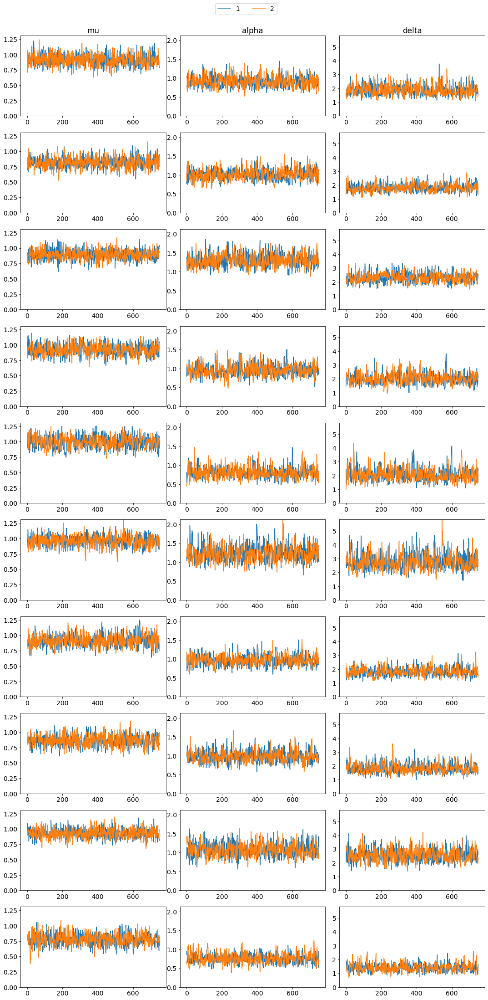

In [141]:
trace_plots(fits, param_strings)

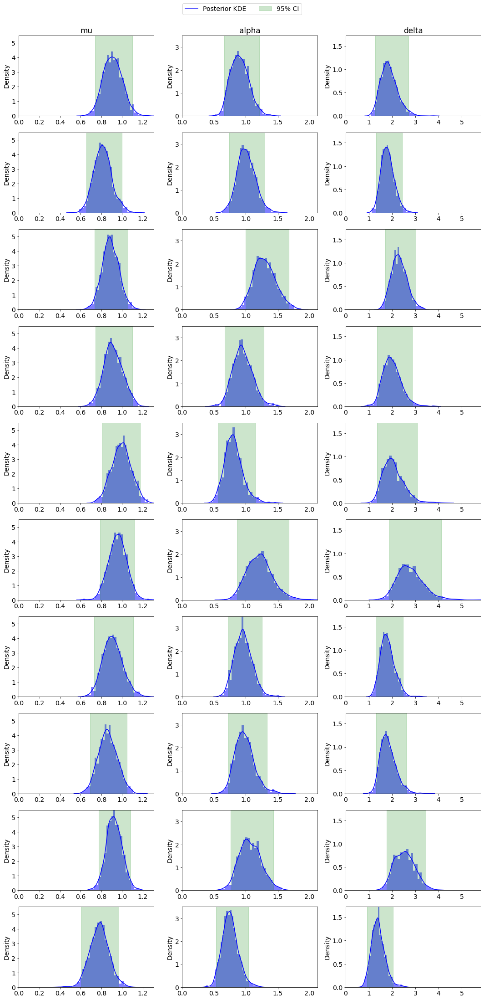

In [142]:
posterior_histograms(fits, param_strings)

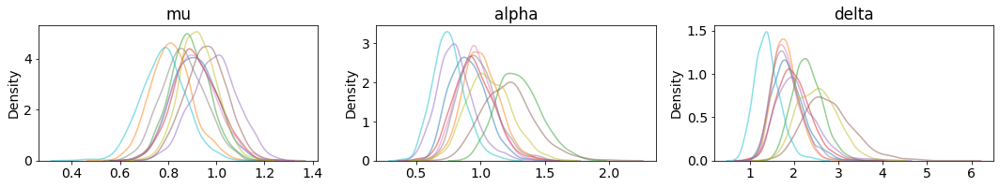

In [143]:
posterior_kdes_overlaid(fits, param_strings)

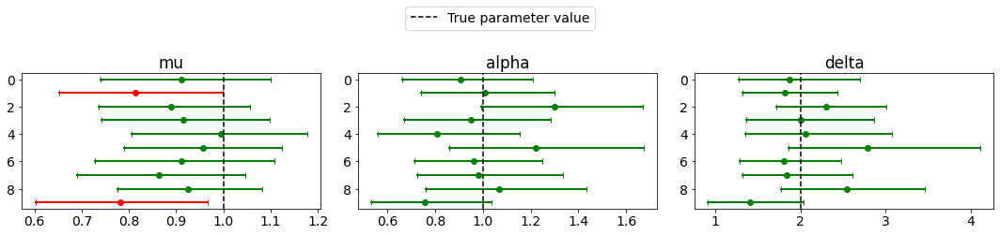

In [144]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

#### T_end=200

In [145]:
T_end=200

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p, time_end=T_end)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [149]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_start_exponential_priors', f'T_end={T_end}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

16:46:33 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=200\realisation0
16:46:33 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=200\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

16:52:39 - cmdstanpy - INFO - CmdStan done processing.
16:52:39 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=200\realisation1
16:52:39 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=200\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

16:59:34 - cmdstanpy - INFO - CmdStan done processing.
16:59:34 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=200\realisation2
16:59:34 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=200\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

17:06:41 - cmdstanpy - INFO - CmdStan done processing.
17:06:41 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=200\realisation3



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=200\realisation3


17:06:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

17:13:26 - cmdstanpy - INFO - CmdStan done processing.
17:13:26 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=200\realisation4
17:13:26 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=200\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

17:18:25 - cmdstanpy - INFO - CmdStan done processing.
17:18:25 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=200\realisation5
17:18:25 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=200\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

17:24:40 - cmdstanpy - INFO - CmdStan done processing.
17:24:40 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=200\realisation6
17:24:40 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=200\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

17:32:29 - cmdstanpy - INFO - CmdStan done processing.
17:32:29 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=200\realisation7
17:32:29 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=200\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

17:51:19 - cmdstanpy - INFO - CmdStan done processing.
17:51:19 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=200\realisation8
17:51:19 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=200\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

18:07:25 - cmdstanpy - INFO - CmdStan done processing.
18:07:25 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=200\realisation9
18:07:25 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=200\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

18:31:04 - cmdstanpy - INFO - CmdStan done processing.


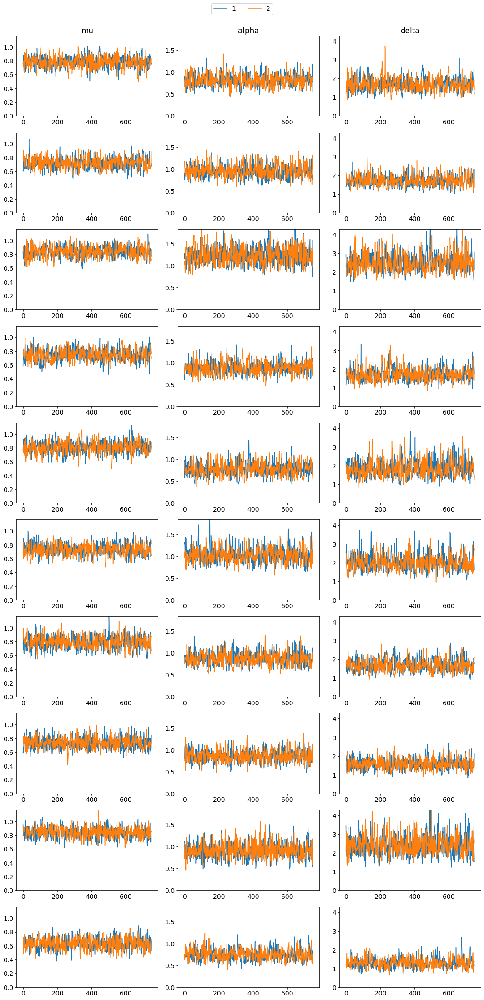

In [150]:
trace_plots(fits, param_strings)

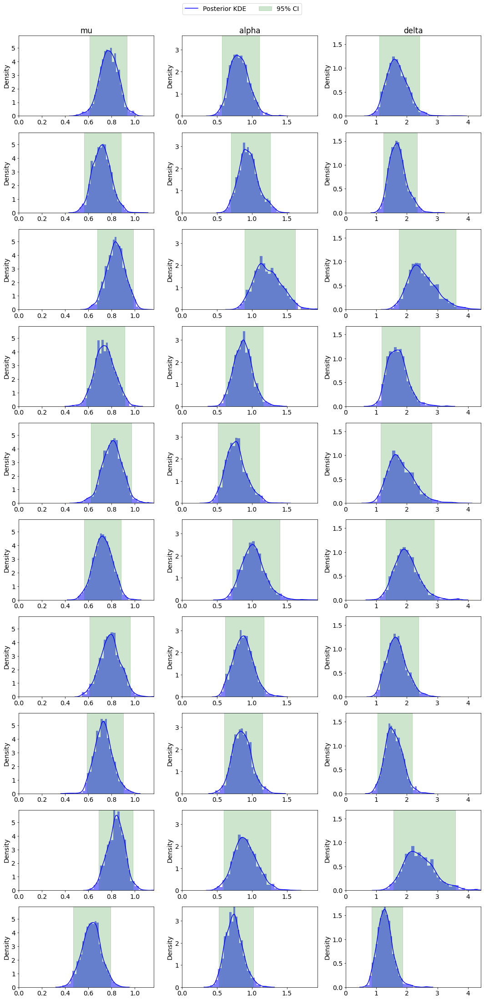

In [151]:
posterior_histograms(fits, param_strings)

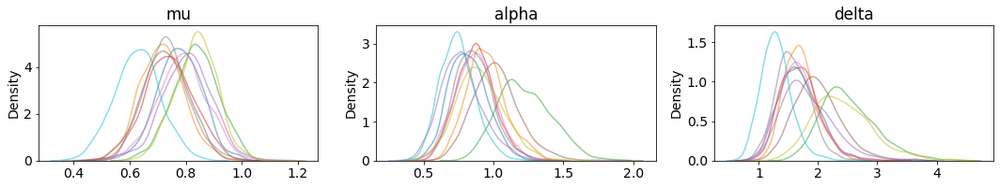

In [152]:
posterior_kdes_overlaid(fits, param_strings)

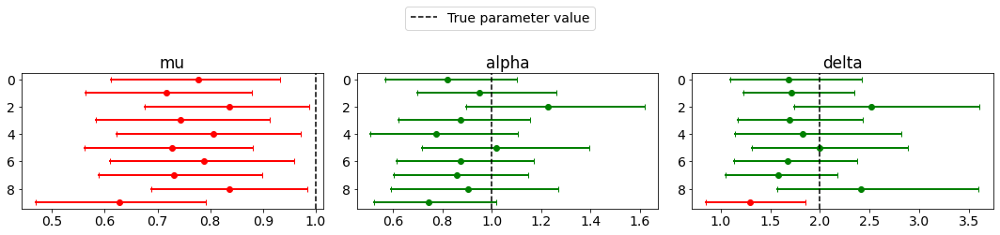

In [153]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

#### T_end=300

In [167]:
T_end=300

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p, time_end=T_end)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [168]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_start_exponential_priors', f'T_end={T_end}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

18:35:59 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=300\realisation0
18:35:59 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=300\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

18:39:32 - cmdstanpy - INFO - CmdStan done processing.
18:39:32 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=300\realisation1
18:39:32 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=300\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

18:43:21 - cmdstanpy - INFO - CmdStan done processing.
18:43:21 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=300\realisation2
18:43:21 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=300\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

18:47:56 - cmdstanpy - INFO - CmdStan done processing.
18:47:56 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=300\realisation3
18:47:56 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=300\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

18:51:55 - cmdstanpy - INFO - CmdStan done processing.
18:51:55 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=300\realisation4
18:51:55 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=300\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

18:55:14 - cmdstanpy - INFO - CmdStan done processing.
18:55:14 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=300\realisation5
18:55:14 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=300\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

18:58:19 - cmdstanpy - INFO - CmdStan done processing.
18:58:19 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=300\realisation6
18:58:19 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=300\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

19:02:20 - cmdstanpy - INFO - CmdStan done processing.
19:02:20 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=300\realisation7
19:02:20 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=300\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

19:06:10 - cmdstanpy - INFO - CmdStan done processing.
19:06:10 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=300\realisation8
19:06:10 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=300\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

19:08:56 - cmdstanpy - INFO - CmdStan done processing.
19:08:56 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=300\realisation9
19:08:56 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=300\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

19:12:49 - cmdstanpy - INFO - CmdStan done processing.


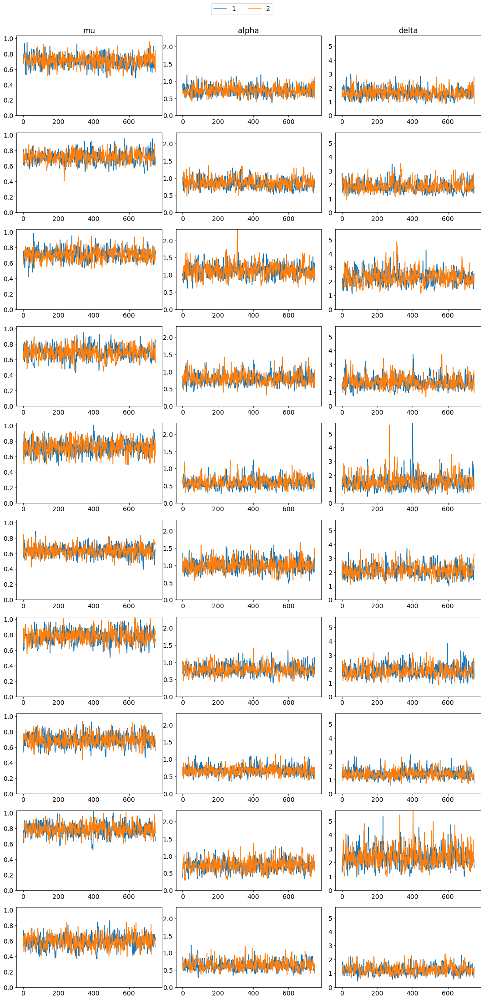

In [169]:
trace_plots(fits, param_strings)

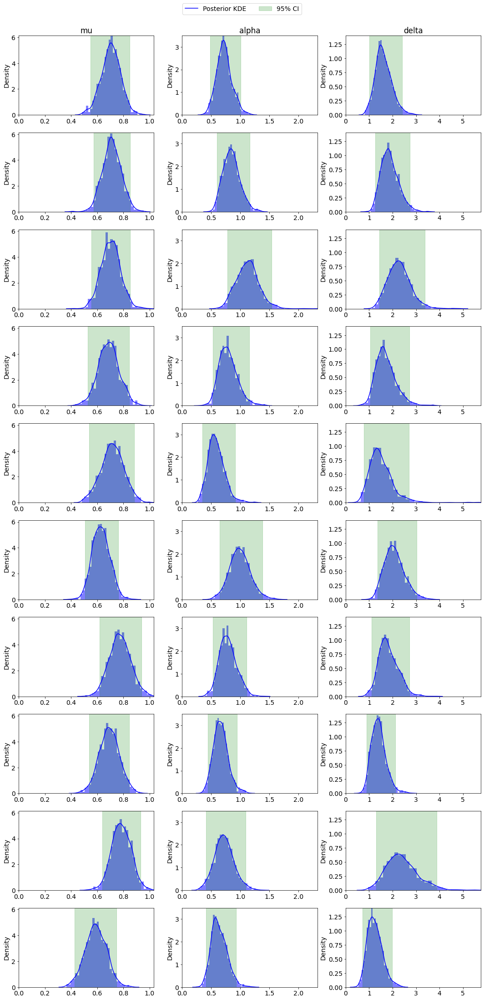

In [170]:
posterior_histograms(fits, param_strings)

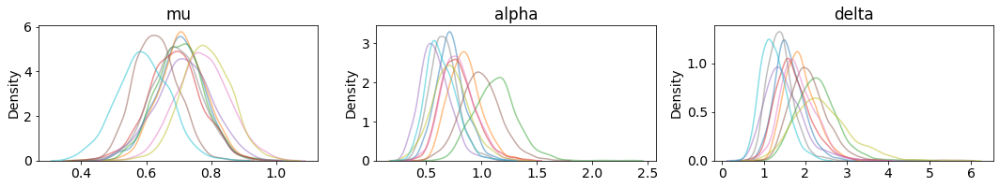

In [171]:
posterior_kdes_overlaid(fits, param_strings)

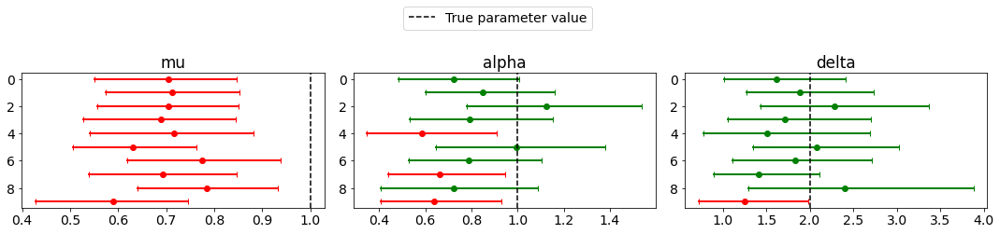

In [172]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

#### T_end=400

In [173]:
T_end=400

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p, time_end=T_end)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [174]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_start_exponential_priors', f'T_end={T_end}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

19:20:26 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=400\realisation0
19:20:26 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=400\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

19:22:56 - cmdstanpy - INFO - CmdStan done processing.


19:22:56 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=400\realisation1
19:22:56 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=400\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

19:25:44 - cmdstanpy - INFO - CmdStan done processing.
19:25:44 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=400\realisation2
19:25:44 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=400\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

19:29:11 - cmdstanpy - INFO - CmdStan done processing.
19:29:11 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=400\realisation3



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=400\realisation3


19:29:11 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

19:32:18 - cmdstanpy - INFO - CmdStan done processing.
19:32:18 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=400\realisation4
19:32:18 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=400\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

19:35:03 - cmdstanpy - INFO - CmdStan done processing.
19:35:03 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=400\realisation5
19:35:03 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=400\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

19:37:21 - cmdstanpy - INFO - CmdStan done processing.
19:37:22 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=400\realisation6
19:37:22 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=400\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

19:40:48 - cmdstanpy - INFO - CmdStan done processing.
19:40:48 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=400\realisation7
19:40:48 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=400\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

19:43:24 - cmdstanpy - INFO - CmdStan done processing.
19:43:24 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=400\realisation8
19:43:24 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=400\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

19:45:37 - cmdstanpy - INFO - CmdStan done processing.
19:45:37 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_start_exponential_priors\T_end=400\realisation9
19:45:37 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_start_exponential_priors\T_end=400\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

19:48:10 - cmdstanpy - INFO - CmdStan done processing.


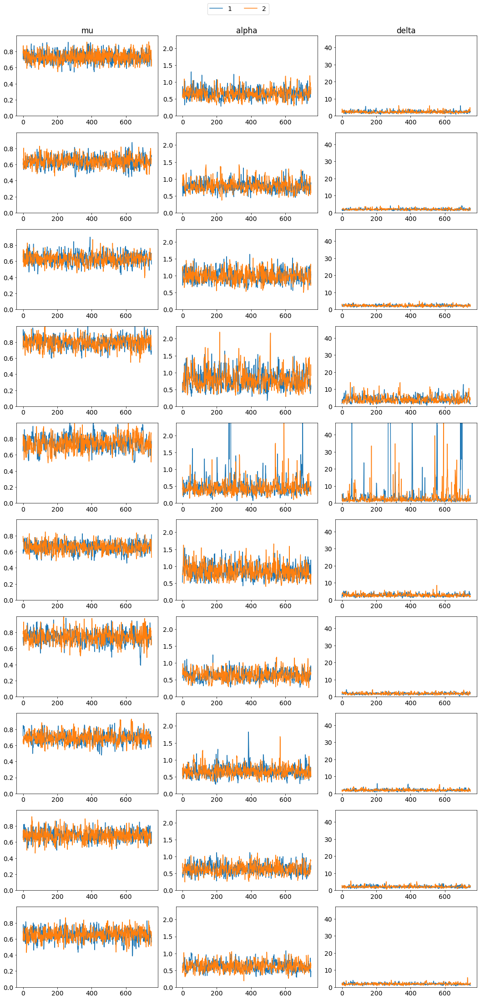

In [175]:
trace_plots(fits, param_strings)

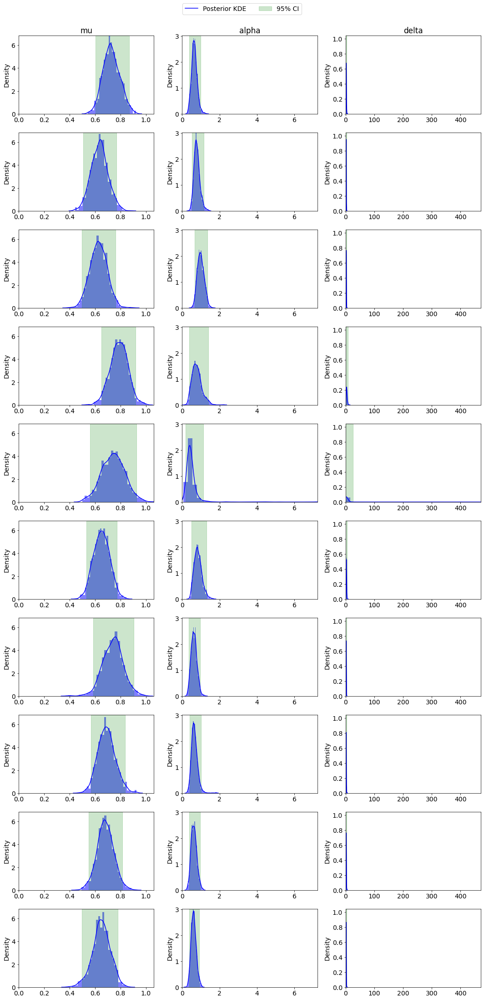

In [176]:
posterior_histograms(fits, param_strings)

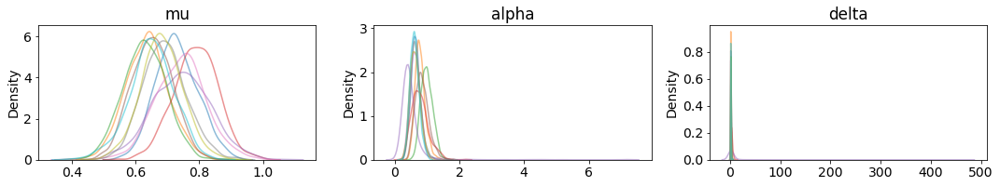

In [177]:
posterior_kdes_overlaid(fits, param_strings)

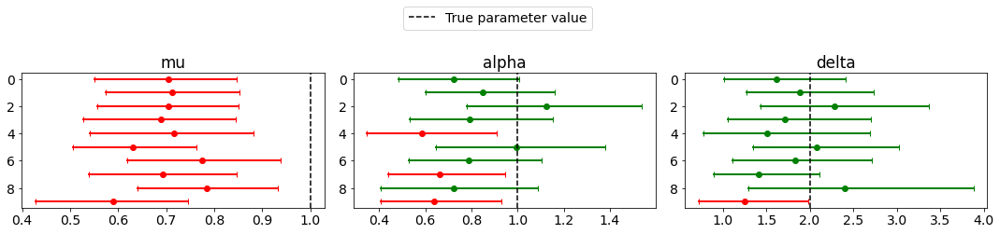

In [172]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

Now need to do the same for missingness at end. (And also plot above each realisation as T_end varies).

### At end

Now we fix T_end=max_T=400 and vary T_start

#### T_start=100

In [181]:
T_start=100

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p, time_start=T_start)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [183]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_end_exponential_priors', f'T_start={T_start}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

22:08:08 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation0
22:08:08 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:13:01 - cmdstanpy - INFO - CmdStan done processing.
22:13:01 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation1



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation1


22:13:01 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:18:40 - cmdstanpy - INFO - CmdStan done processing.



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation2


22:18:41 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation2
22:18:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:25:28 - cmdstanpy - INFO - CmdStan done processing.
22:25:28 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation3
22:25:28 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:31:26 - cmdstanpy - INFO - CmdStan done processing.
22:31:26 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation4



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation4


22:31:26 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:35:28 - cmdstanpy - INFO - CmdStan done processing.
22:35:28 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation5
22:35:28 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:39:43 - cmdstanpy - INFO - CmdStan done processing.
22:39:44 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation6
22:39:44 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:46:26 - cmdstanpy - INFO - CmdStan done processing.
22:46:26 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation7
22:46:26 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:50:41 - cmdstanpy - INFO - CmdStan done processing.
22:50:41 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation8



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation8


22:50:41 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

22:55:45 - cmdstanpy - INFO - CmdStan done processing.
22:55:45 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=100\realisation9
22:55:45 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=100\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

23:00:43 - cmdstanpy - INFO - CmdStan done processing.


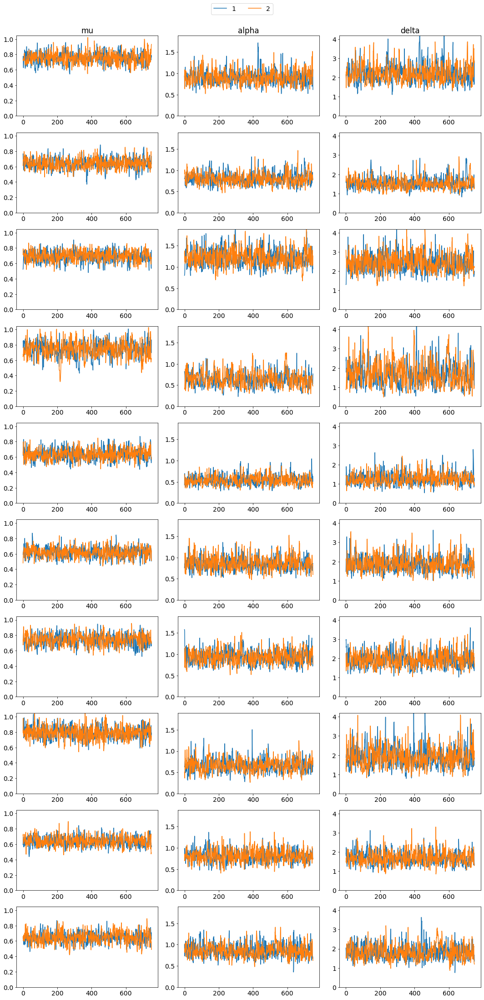

In [184]:
trace_plots(fits, param_strings)

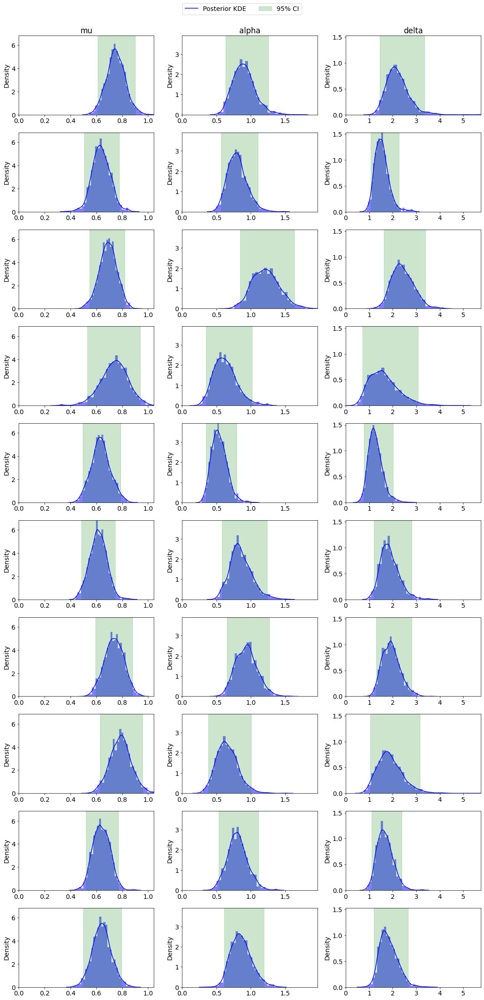

In [185]:
posterior_histograms(fits, param_strings)

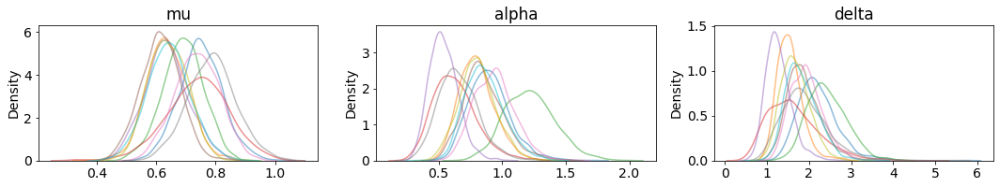

In [186]:
posterior_kdes_overlaid(fits, param_strings)

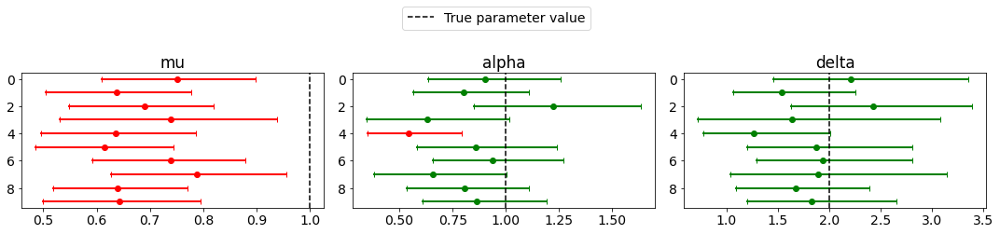

In [187]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

#### T_start=200

In [188]:
T_start=200

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p, time_start=T_start)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [189]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_end_exponential_priors', f'T_start={T_start}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

00:36:34 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation0
00:36:34 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:42:30 - cmdstanpy - INFO - CmdStan done processing.
00:42:30 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation1
00:42:30 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:48:40 - cmdstanpy - INFO - CmdStan done processing.
00:48:40 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation2
00:48:40 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

00:55:43 - cmdstanpy - INFO - CmdStan done processing.
00:55:43 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation3
00:55:43 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:01:26 - cmdstanpy - INFO - CmdStan done processing.
01:01:26 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation4
01:01:26 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:06:09 - cmdstanpy - INFO - CmdStan done processing.
01:06:09 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation5
01:06:09 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:11:01 - cmdstanpy - INFO - CmdStan done processing.
01:11:01 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation6
01:11:01 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:19:37 - cmdstanpy - INFO - CmdStan done processing.
01:19:37 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation7
01:19:37 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:24:53 - cmdstanpy - INFO - CmdStan done processing.



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation8


01:24:53 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation8
01:24:53 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:30:09 - cmdstanpy - INFO - CmdStan done processing.
01:30:09 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=200\realisation9
01:30:09 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=200\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:35:43 - cmdstanpy - INFO - CmdStan done processing.


In [196]:
T_start=200
fits = []
save_dir = os.path.join('.', 'saved_fits', 'missingness_end_exponential_priors', f'T_start={T_start}')
for j in range(10):
    save_path = os.path.join(save_dir, f'realisation{j}')
    fits.append(cmdstanpy.from_csv(save_path))

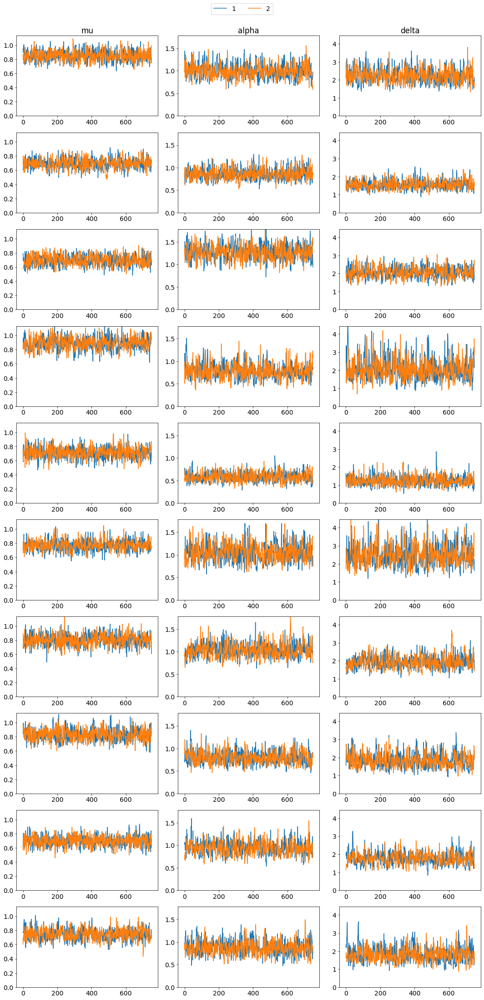

In [197]:
trace_plots(fits, param_strings)

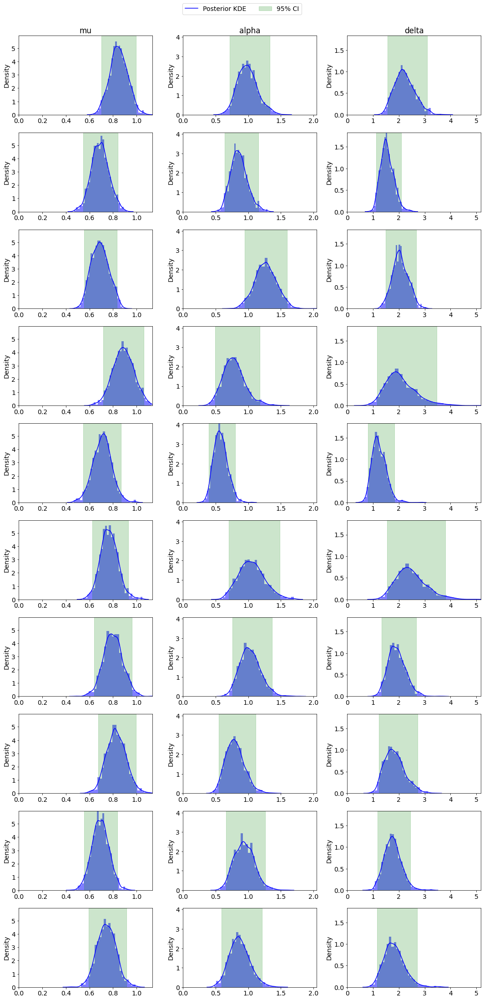

In [198]:
posterior_histograms(fits, param_strings)

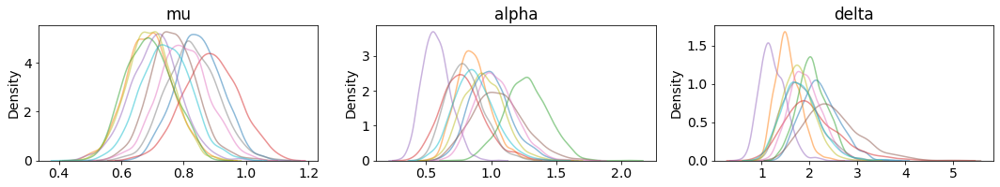

In [199]:
posterior_kdes_overlaid(fits, param_strings)

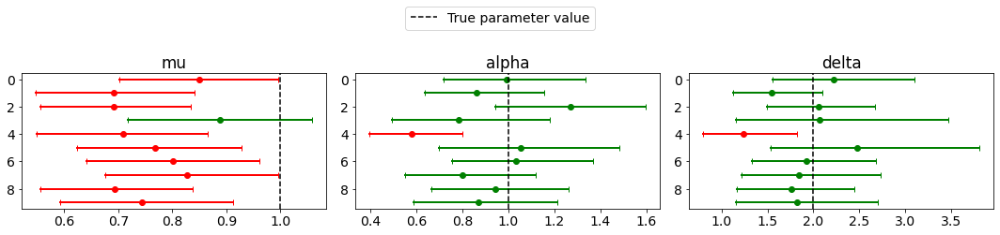

In [200]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

#### T_start=300

In [190]:
T_start=300

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p, time_start=T_start)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [191]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_end_exponential_priors', f'T_start={T_start}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

01:35:43 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation0
01:35:43 - cmdstanpy - INFO - CmdStan start processing


MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation0


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:43:26 - cmdstanpy - INFO - CmdStan done processing.
01:43:26 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation1
01:43:26 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

01:51:46 - cmdstanpy - INFO - CmdStan done processing.
01:51:46 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation2
01:51:46 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

02:01:48 - cmdstanpy - INFO - CmdStan done processing.
02:01:49 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation3
02:01:49 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

02:10:03 - cmdstanpy - INFO - CmdStan done processing.
02:10:03 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation4
02:10:03 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

02:16:40 - cmdstanpy - INFO - CmdStan done processing.
02:16:40 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation5
02:16:40 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

02:23:55 - cmdstanpy - INFO - CmdStan done processing.
02:23:55 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation6
02:23:55 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

02:36:57 - cmdstanpy - INFO - CmdStan done processing.



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation7


02:36:58 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation7
02:36:58 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

02:44:51 - cmdstanpy - INFO - CmdStan done processing.
02:44:52 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation8
02:44:52 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

02:51:35 - cmdstanpy - INFO - CmdStan done processing.
02:51:36 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=300\realisation9
02:51:36 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=300\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

02:58:43 - cmdstanpy - INFO - CmdStan done processing.


In [201]:
T_start=300
fits = []
save_dir = os.path.join('.', 'saved_fits', 'missingness_end_exponential_priors', f'T_start={T_start}')
for j in range(10):
    save_path = os.path.join(save_dir, f'realisation{j}')
    fits.append(cmdstanpy.from_csv(save_path))

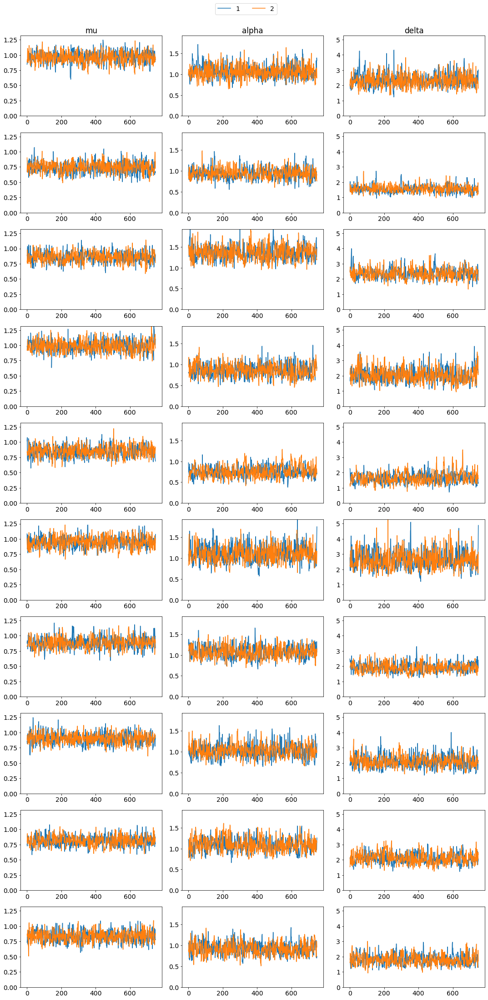

In [202]:
trace_plots(fits, param_strings)

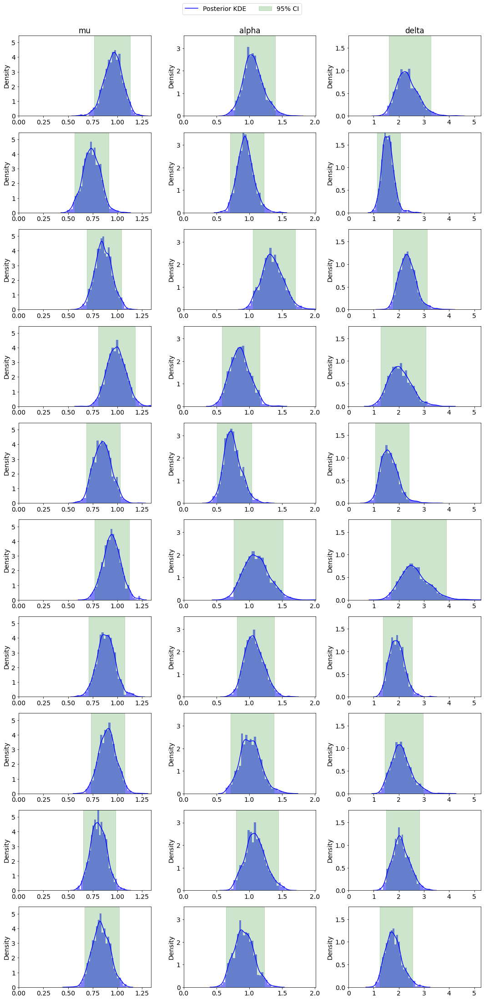

In [203]:
posterior_histograms(fits, param_strings)

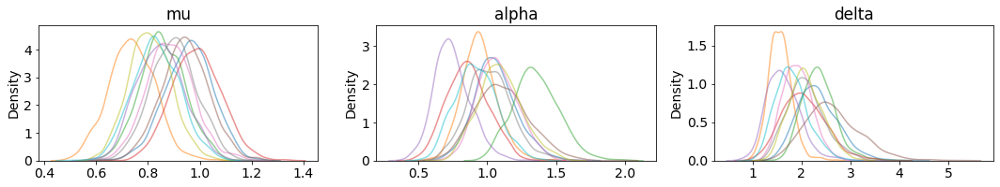

In [204]:
posterior_kdes_overlaid(fits, param_strings)

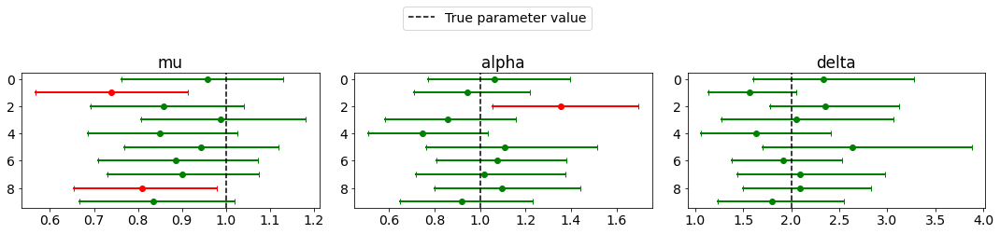

In [205]:
stacked_credible_intervals(fits, param_strings, [1,1,2])

#### T_start=400

In [192]:
T_start=400

data_list = []
for realisation, random_labels in zip(hawkes_realisations, random_label_lists):

    realisation_with_missingness = corrupt_realisation(realisation, random_labels, p, time_start=T_start)

    data = {
        "N": len(realisation_with_missingness),
        "events_list": realisation_with_missingness,
        "max_T": max_T
    }

    data_list.append(data)

In [193]:
warmup = 250

master_seed_stan = 43526238385608073352718321501689842867
seed_seq_master_stan = np.random.SeedSequence(master_seed_stan)

fits = []

save_dir = os.path.join('.', 'saved_fits', 'missingness_end_exponential_priors', f'T_start={T_start}')

for i in range(num_samples):
    print(f"MCMC sampling for realisation {i}")

    child_seed_stan = seed_seq_master_stan.spawn(1)[0]

    # Create a random number generator using the seed
    rng = np.random.default_rng(child_seed_stan)
    
    # Generate random integers less than 2**32 - 1
    child_seed = rng.integers(2**32 - 1)
    print(f"Child seed used = {child_seed}")

    save_path = os.path.join(save_dir, f"realisation{i}")
    print(f"Saving to {save_path}")

    fit = model_compiled.sample(data=data_list[i],
                                seed=child_seed,
                                chains=2,
                                parallel_chains=2,
                                iter_warmup=warmup,
                                iter_sampling=3*warmup,
                                inits="0",
                                save_warmup=True,
                                output_dir=save_path)
    
    fits.append(fit)

MCMC sampling for realisation 0
Child seed used = 1335997441
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation0


02:58:43 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation0
02:58:43 - cmdstanpy - INFO - CmdStan start processing


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

03:08:40 - cmdstanpy - INFO - CmdStan done processing.
03:08:40 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation1
03:08:40 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 1
Child seed used = 3161308824
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation1


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

03:19:53 - cmdstanpy - INFO - CmdStan done processing.
03:19:53 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation2
03:19:53 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 2
Child seed used = 157769519
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation2


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

03:34:51 - cmdstanpy - INFO - CmdStan done processing.
03:34:51 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation3
03:34:51 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 3
Child seed used = 1588878709
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation3


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

03:45:26 - cmdstanpy - INFO - CmdStan done processing.
03:45:26 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation4
03:45:26 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 4
Child seed used = 3919124237
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation4


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

03:53:32 - cmdstanpy - INFO - CmdStan done processing.
03:53:33 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation5
03:53:33 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 5
Child seed used = 2925522856
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation5


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

04:03:50 - cmdstanpy - INFO - CmdStan done processing.
04:03:50 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation6
04:03:50 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 6
Child seed used = 2963777707
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation6


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

04:17:20 - cmdstanpy - INFO - CmdStan done processing.
04:17:20 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation7
04:17:20 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 7
Child seed used = 842792797
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation7


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

04:29:18 - cmdstanpy - INFO - CmdStan done processing.
04:29:18 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation8
04:29:18 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 8
Child seed used = 1831251485
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation8


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

04:37:40 - cmdstanpy - INFO - CmdStan done processing.
04:37:40 - cmdstanpy - INFO - created output directory: C:\Users\ethan\OneDrive - University of Bristol\Maths\Year 4\Project\hawkes_project\bayesian_clean\saved_fits\missingness_end_exponential_priors\T_start=400\realisation9
04:37:40 - cmdstanpy - INFO - CmdStan start processing



MCMC sampling for realisation 9
Child seed used = 5509238
Saving to .\saved_fits\missingness_end_exponential_priors\T_start=400\realisation9


chain 1 |          | 00:00 Status

chain 2 |          | 00:00 Status

04:47:59 - cmdstanpy - INFO - CmdStan done processing.


In [206]:
T_start=400
fits = []
save_dir = os.path.join('.', 'saved_fits', 'missingness_end_exponential_priors', f'T_start={T_start}')
for j in range(10):
    save_path = os.path.join(save_dir, f'realisation{j}')
    fits.append(cmdstanpy.from_csv(save_path))

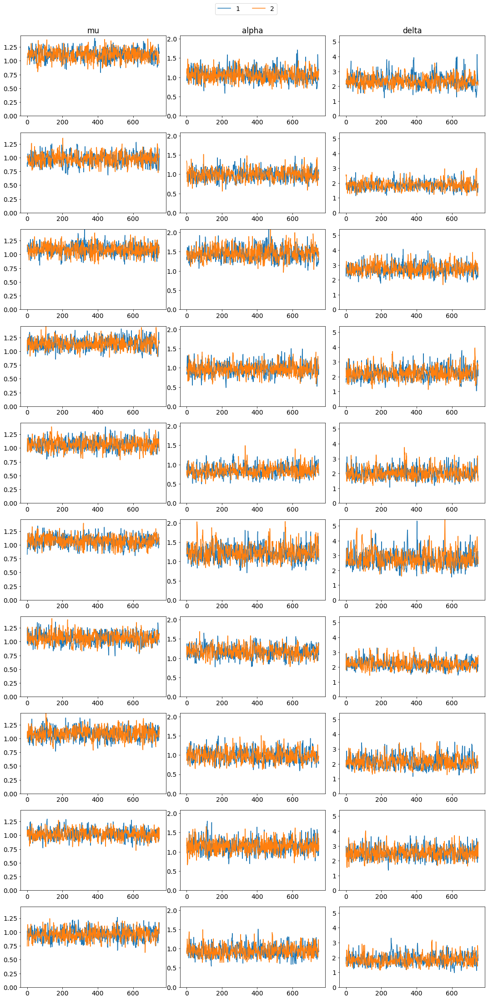

In [207]:
trace_plots(fits, param_strings)

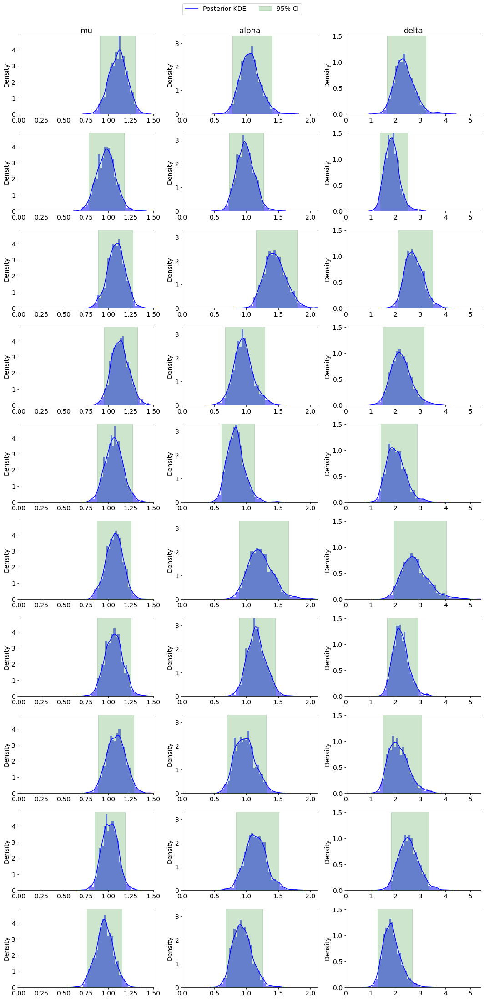

In [208]:
posterior_histograms(fits, param_strings)

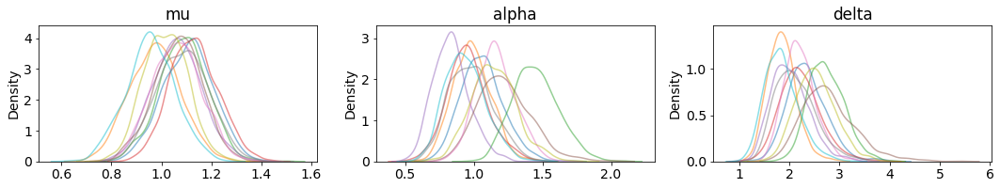

In [209]:
posterior_kdes_overlaid(fits, param_strings)

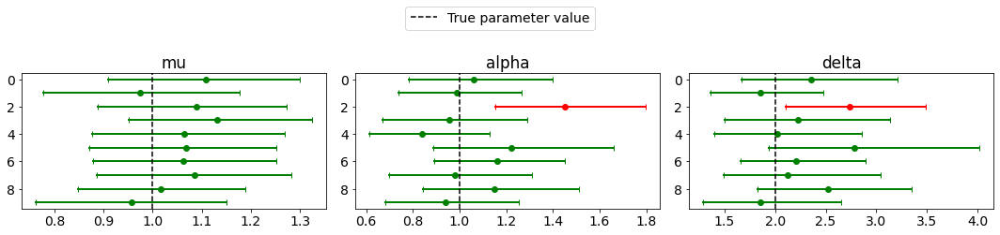

In [210]:
stacked_credible_intervals(fits, param_strings, [1,1,2])